In [58]:
from __future__ import print_function, division
import scipy


import keras
from keras.datasets import mnist
#from keras_contrib.layers.normalization import InstanceNormalization
from keras.layers import Input, Dense, Reshape, Flatten, Dropout, Concatenate
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv1D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import Adam, SGD, RMSprop
import datetime
import matplotlib.pyplot as plt
import sys
from data_loader import DataLoader
import numpy as np
import os
from glob import glob

In [2]:
def gen_data(f_mean_shift=(2,3), fvar=2, g_mean_shift=(-1,-1), gvar=0.5, num_pts=10000, mean=(0,0), var=1.0, batch_size=1):
        #data_type = "train%s" % domain if not is_testing else "test%s" % domain
        cov=var*np.eye(2)
        orig = np.random.multivariate_normal(mean, cov, num_pts)
        fmean=np.asarray(mean)+np.asarray(f_mean_shift)
        fpts= np.random.multivariate_normal(fmean, fvar*cov, num_pts)
        gmean=np.asarray(mean)+np.asarray(g_mean_shift)
        gpts=np.random.multivariate_normal(gmean, gvar*cov, num_pts)

        return orig, fpts, gpts

In [3]:
def wasserstein(y_true, y_pred):

    # return K.mean(y_true * y_pred) / K.mean(y_true)
    return K.mean(y_true * y_pred)


def visualize_model(model):

    model.summary()
    from keras.utils import plot_model
    plot_model(model,
               to_file='../../figures/%s.png' % model.name,
               show_shapes=True,
               show_layer_names=True)

In [59]:
class CycleGAN():
    def __init__(self, data_A, data_B, d_batch_size=16, lr_G=0.001, lr_D=0.0005):
        
        #
        self.data_shape=(2,)
        self.data_dim=2
        self.d_batch_size=d_batch_size

        # Loss weights
        ##################################
        # First change: set cycle-consistency weight to unit.
        # Could probably do the same to identity-loss weight
        # without much change, but the lambda_cycle weight
        # did seem to have an effect
        ##################################
        self.lambda_cycle = 0.1                    # Cycle-consistency loss
        self.lambda_id = 0.01 * self.lambda_cycle    # Identity loss

        ##################################
        # Second change: optimizers
        # Start with SGD on easy data, then consider using Adam/RMSprop when you
        # get a feel for how training will go. The former is simpler and more
        # predictable, the latter can be erratic if you don't understand how to
        # set the hyperparameters.
        #
        # And then: different learning rates for generator and discriminator.
        # I'm suspicious of anyone who doesn't do this unless the discriminator
        # is non-sigmoid.
        # I'm suspicious of non-sigmoid discriminators except Wasserstein GAN.
        ##################################
        optimizer_G = RMSprop(lr=lr_G)
        optimizer_D = RMSprop(lr=lr_D)

        ##################################
        # Third change: discriminator loss
        # The original CycleGAN authors used MSE instead of BCE.
        # They cited some paper I've never heard of which claimed
        # that it encourages stability.
        # This sounds like a poor-man's Wasserstein GAN without
        # any of the analysis to back it up, FWIW.
        # Switched back to BCE because we know it works on
        # other types of GANs.
        #
        # ALSO: The discriminator's output layer had a sigmoid
        # activation, which doesn't make sense with MSE.
        # If you look in the original cyclegan.py, the
        # discriminator's final layer was the default activation,
        # which is linear. This makes more sense with MSE.
        # I also tried leaving MSE loss, and making the discriminator's
        # last activation linear, but that didn't work as well.
        ##################################
        self.d_A = self.build_discriminator()
        self.d_B = self.build_discriminator()
        self.d_A.compile(loss='binary_crossentropy', optimizer=optimizer_D, metrics=['accuracy'])
        self.d_B.compile(loss='binary_crossentropy', optimizer=optimizer_D, metrics=['accuracy'])

        #-------------------------
        # Construct Computational
        #   Graph of Generators
        #-------------------------

        # Build the generators
        self.g_AB = self.build_generator()
        self.g_BA = self.build_generator()

        # Input instances from both domains
        datum_A = [Input(shape=self.data_shape) for i in range(self.d_batch_size)]
        datum_B = [Input(shape=self.data_shape) for i in range(self.d_batch_size)]


        #Is this going to work the way I have it here
        #or should I be taking something from a batch?
        # Translate images to the other domain
        fake_B = [self.g_AB(datum_A[i]) for i in range(self.d_batch_size)]
        fake_A = [self.g_BA(datum_B[i]) for i in range(self.d_batch_size)]
        # Translate images back to original domain
        reconstr_A = [self.g_BA(fake_B[i]) for i in range(self.d_batch_size)]
        reconstr_B = [self.g_AB(fake_A[i]) for i in range(self.d_batch_size)]
        # Identity mapping of images
        datum_A_id = [self.g_BA(datum_A[i]) for i in range(self.d_batch_size)]
        datum_B_id = [self.g_AB(datum_B[i]) for i in range(self.d_batch_size)]

        # For the combined model we will only train the generators
        self.d_A.trainable = False
        self.d_B.trainable = False

        # Discriminators determines validity of translated images
        valid_A = self.d_A(fake_A)
        valid_B = self.d_B(fake_B)

        ##################################
        # Third change (part two): consistent switch to BCE
        # for all discriminator losses
        ##################################
        # Combined model trains generators to fool discriminators
        combined_outputs = [valid_A, valid_B] + reconstr_A + reconstr_B + datum_A_id + datum_B_id
        loss_fns = ['binary_crossentropy' for i in range(2)] + ['mae' for i in range(4*self.d_batch_size)]
        loss_wgt = [1 for i in range(2)] + [self.lambda_cycle for i in range(2*self.d_batch_size)] + [self.lambda_id for i in range(2*self.d_batch_size)]
        self.combined = Model(inputs=datum_A+datum_B, outputs=combined_outputs)
        self.combined.compile(loss=loss_fns, loss_weights=loss_wgt, optimizer=optimizer_G)

    def build_generator(self):
        """
        Simple MLP generator for the MoG unrolled GAN toy experiment
        """
        gen_input = Input(shape=(self.data_dim,), name="generator_input")

        x = Dense(2*self.data_dim)(gen_input)
        x = Activation("tanh")(x)
        x = Dense(2*self.data_dim)(x)
        x = Activation("tanh")(x)
        x = Dense(2*self.data_dim)(x)
        x = Activation("tanh")(x)
        x = Dense(self.data_dim)(x)
        x = Activation("tanh")(x)
        x = Dense(self.data_dim)(gen_input)

        generator_model = Model(inputs=[gen_input], outputs=[x])
        #visualize_model(generator_model)

        return generator_model

#        
    def build_discriminator(self):

        """
        Simple MLP discriminator for the MoG unrolled GAN toy experiment
        """

        disc_inputs = [Input(shape=(2,), name="discriminator_input_%d" % i) for i in range(self.d_batch_size)]
        disc_input = Concatenate()(disc_inputs)

        x = Reshape((self.d_batch_size*self.data_dim, 1))(disc_input)
        x = Conv1D(filters=16, kernel_size=self.data_dim, strides=2)(x)
        x = Activation("tanh")(x)
        x = Conv1D(filters=16, kernel_size=self.data_dim, strides=1)(x)
        x = Activation("tanh")(x)
        x = Conv1D(filters=16, kernel_size=self.data_dim, strides=1)(x)
        x = Activation("tanh")(x)
        x = Flatten()(x)
        x = Dense(128)(disc_input)
        x = Activation("tanh")(x)
        x = Dense(1, activation="sigmoid")(x)

        discriminator_model = Model(inputs=disc_inputs, outputs=[x])

        return discriminator_model

    
    def train(self, epochs, batch_size=1, sample_interval=50):

        start_time = datetime.datetime.now()

        # Adversarial loss ground truths
        valid = np.ones((batch_size,)) #+ self.disc_patch)
        fake = np.zeros((batch_size,)) #+ self.disc_patch)
        self.n_batches = int(min(len(data_A), len(data_B)) / (batch_size))
        #total_samples = self.n_batches * batch_size
        for epoch in range(epochs):
            for i in range(self.n_batches-self.d_batch_size):
                #randomly shuffle data?
                
                #take the corresponding "Batch size" number of elements
                batch_A = [data_A[(i+j)*batch_size:(i+j+1)*batch_size] for j in range(self.d_batch_size)]
                batch_B = [data_B[(i+j)*batch_size:(i+j+1)*batch_size] for j in range(self.d_batch_size)]
                #put them through this thing
                
                
                # ----------------------
                #  Train Discriminators
                # ----------------------
               # print(imgs_A.shape)

                # Translate images to opposite domain
                fake_B = [self.g_AB.predict(batch_A[j]) for j in range(self.d_batch_size)]
                fake_A = [self.g_BA.predict(batch_B[j]) for j in range(self.d_batch_size)]
                #print(fake_A.shape)
                #print(fake_B.shape)
                # Train the discriminators (original images = real / translated = Fake)
                dA_loss_real = self.d_A.train_on_batch(batch_A, valid)
                dA_loss_fake = self.d_A.train_on_batch(fake_A, fake)
                dA_loss = 0.5 * np.add(dA_loss_real, dA_loss_fake)

                dB_loss_real = self.d_B.train_on_batch(batch_B, valid)
                dB_loss_fake = self.d_B.train_on_batch(fake_B, fake)
                dB_loss = 0.5 * np.add(dB_loss_real, dB_loss_fake)

                # Total disciminator loss
                d_loss = 0.5 * np.add(dA_loss, dB_loss)


                # ------------------
                #  Train Generators
                # ------------------

                # Train the generators
                g_loss = self.combined.train_on_batch(batch_A + batch_B, 
                                                      [valid, valid] + batch_A + batch_B + batch_A + batch_B)

                elapsed_time = datetime.datetime.now() - start_time

                # Plot the progress
            if epoch % sample_interval == 0:
                print ("[Epoch %d/%d] [Batch %d/%d] [D loss: %f, acc: %3d%%] [G loss: %05f, adv: %05f, recon: %05f, id: %05f] time: %s " \
                                                                        % ( epoch, epochs,
                                                                            i, self.n_batches,
                                                                            d_loss[0], 100*d_loss[1],
                                                                            g_loss[0],
                                                                            np.mean(g_loss[1:3]),
                                                                            np.mean(g_loss[3:5]),
                                                                            np.mean(g_loss[5:6]),
                                                                            elapsed_time))

            # If at save interval => save generated image samples
            if epoch % sample_interval == 0:
                self.sample_data(epoch, i)

    def sample_data(self, epoch, batch_i):
       # r, c = 2, 3

        orig2, pic_data_A, pic_data_B= gen_data((10,10), 3, (-7,6), .25, 1000)
        
    
        # Translate images to the other domain
        fake_B = self.g_AB.predict(pic_data_A)
        fake_A = self.g_BA.predict(pic_data_B)
        # Translate back to original domain
        reconstr_A = self.g_BA.predict(fake_B)
        reconstr_B = self.g_AB.predict(fake_A)
        
        fig = plt.figure(figsize=(16,7))
        ax1 = fig.add_subplot(131)

        ax1.scatter(pic_data_A[:, 0], pic_data_A[:,1], s=25, c='b', marker="s", label='OA')
        ax1.scatter(fake_A[:,0], fake_A[:,1], c='r', s=25, marker="o", label='FA')
        ax1.scatter(reconstr_A[:,0], reconstr_A[:,1], s=25, c='g', marker="o", label='RA')
        plt.legend(loc='upper left');
        
        ax2=fig.add_subplot(132)
        ax2.scatter(pic_data_B[:, 0], pic_data_B[:,1], s=25, c='b', marker="s", label='OB')
        ax2.scatter(fake_B[:,0], fake_B[:,1], s=25, c='r', marker="o", label='FB')
        ax2.scatter(reconstr_B[:,0], reconstr_B[:,1], s=25, c='g', marker="o", label='RB')
        plt.legend(loc='upper left');
        
        ax3=fig.add_subplot(133)
        ax3.scatter(pic_data_A[:, 0], pic_data_A[:,1], s=25, c='b', marker="s", label='OA')
        ax3.scatter(fake_A[:,0], fake_A[:,1], c='r', s=25, marker="o", label='FA')
        ax3.scatter(reconstr_A[:,0], reconstr_A[:,1], s=25, c='g', marker="o", label='RA')
        ax3.scatter(pic_data_B[:, 0], pic_data_B[:,1], s=25, c='c', marker="s", label='OB')
        ax3.scatter(fake_B[:,0], fake_B[:,1], s=25, c='m', marker="o", label='FB')
        ax3.scatter(reconstr_B[:,0], reconstr_B[:,1], s=25, c='y', marker="o", label='RB')
        plt.legend(loc='upper left');
        
        plt.show()
        plt.clf()
        fig.savefig("images/%d_%d.png" % (epoch, batch_i))
        plt.close()

In [60]:
orig, data_A, data_B=gen_data((10,10), 3, (-7,6), .25, 1000)

In [68]:
gan = CycleGAN(data_A, data_B)

[Epoch 0/101] [Batch 983/1000] [D loss: 0.862338, acc:  50%] [G loss: 4.624656, adv: 1.073839, recon: 1.376160, id: 0.886244] time: 0:00:25.060201 


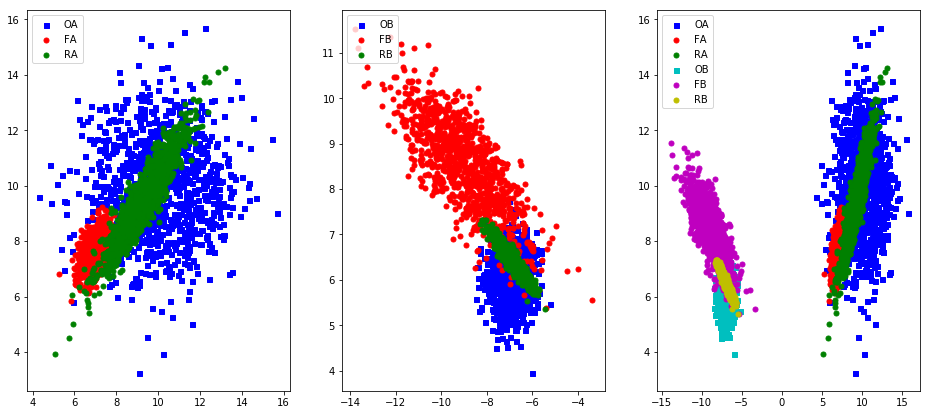

[Epoch 10/101] [Batch 983/1000] [D loss: 0.481238, acc:  75%] [G loss: 3.326195, adv: 1.467862, recon: 0.032056, id: 0.029454] time: 0:02:11.563649 


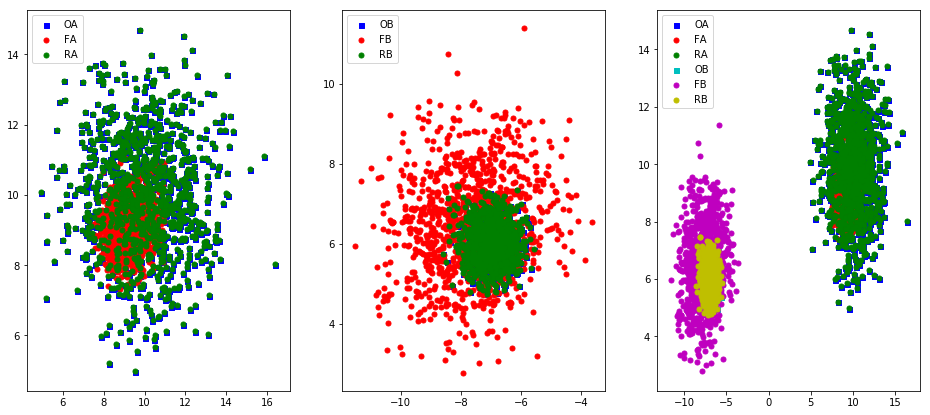

[Epoch 20/101] [Batch 983/1000] [D loss: 0.248728, acc: 100%] [G loss: 5.445905, adv: 2.477762, recon: 0.054059, id: 0.041004] time: 0:03:58.503418 


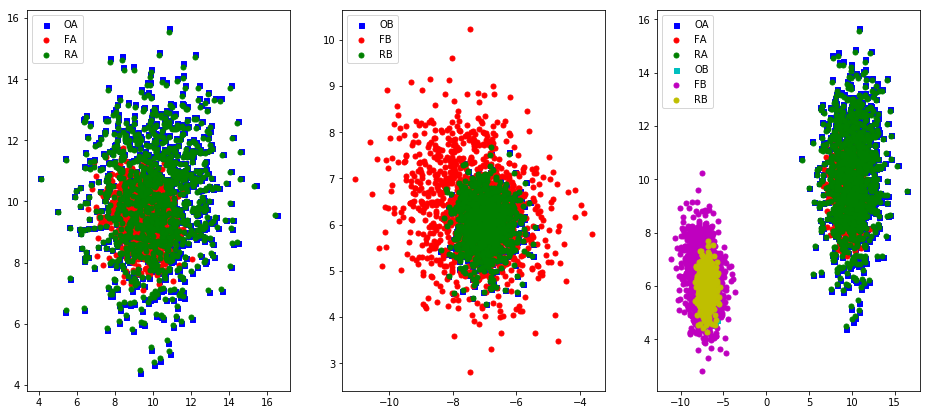

[Epoch 30/101] [Batch 983/1000] [D loss: 0.198293, acc: 100%] [G loss: 7.401322, adv: 3.276172, recon: 0.189144, id: 0.119297] time: 0:05:45.199094 


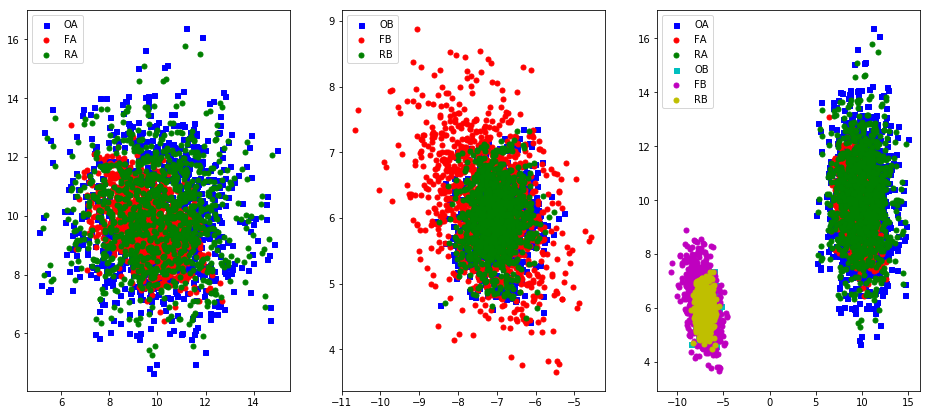

[Epoch 40/101] [Batch 983/1000] [D loss: 0.213179, acc: 100%] [G loss: 7.897829, adv: 3.307410, recon: 0.349162, id: 0.193508] time: 0:07:32.693508 


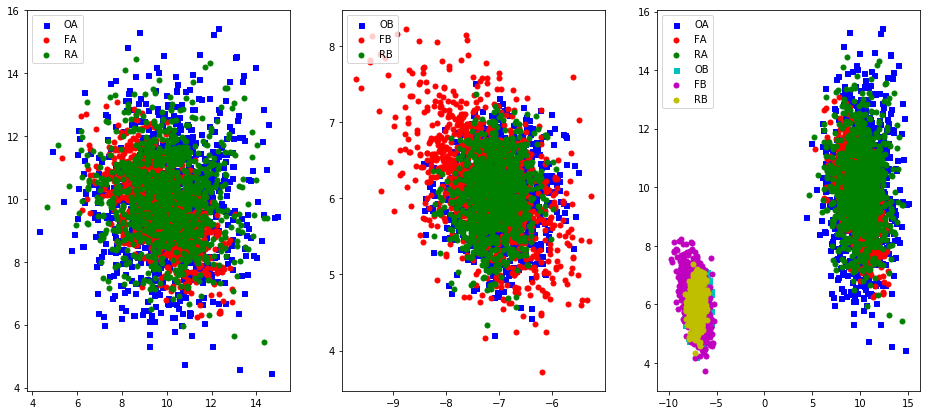

[Epoch 50/101] [Batch 983/1000] [D loss: 0.228785, acc: 100%] [G loss: 8.040229, adv: 3.192051, recon: 0.457699, id: 0.264209] time: 0:09:20.335268 


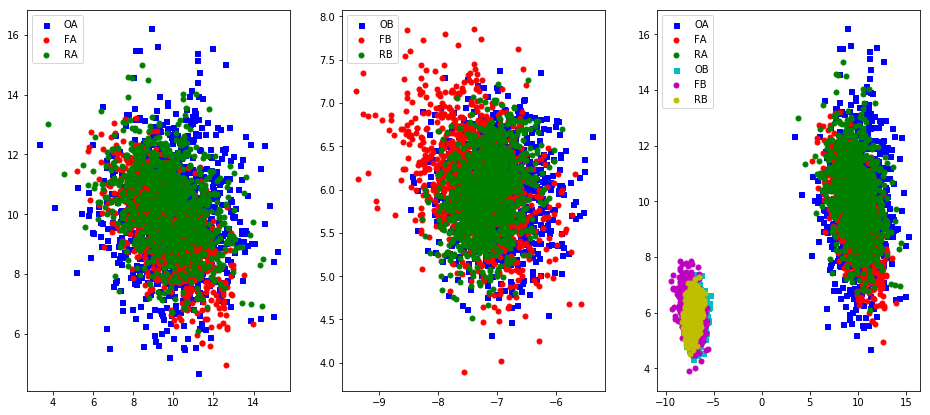

[Epoch 60/101] [Batch 983/1000] [D loss: 0.245609, acc: 100%] [G loss: 8.137818, adv: 3.215600, recon: 0.428586, id: 0.268365] time: 0:11:08.194581 


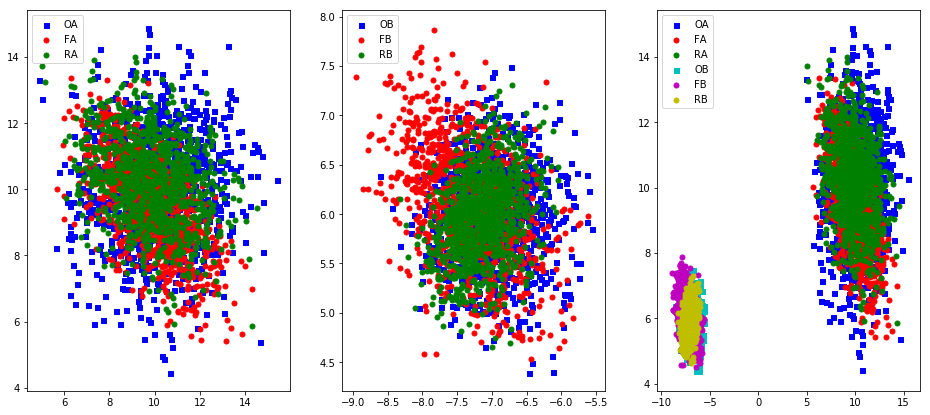

[Epoch 70/101] [Batch 983/1000] [D loss: 0.240052, acc: 100%] [G loss: 8.244844, adv: 3.292057, recon: 0.365045, id: 0.274725] time: 0:12:56.003198 


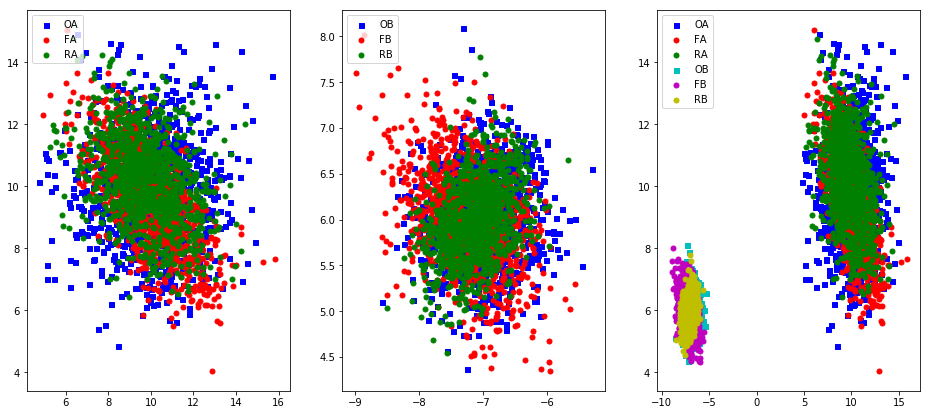

[Epoch 80/101] [Batch 983/1000] [D loss: 0.229326, acc: 100%] [G loss: 8.148363, adv: 3.307289, recon: 0.261789, id: 0.237094] time: 0:14:43.064012 


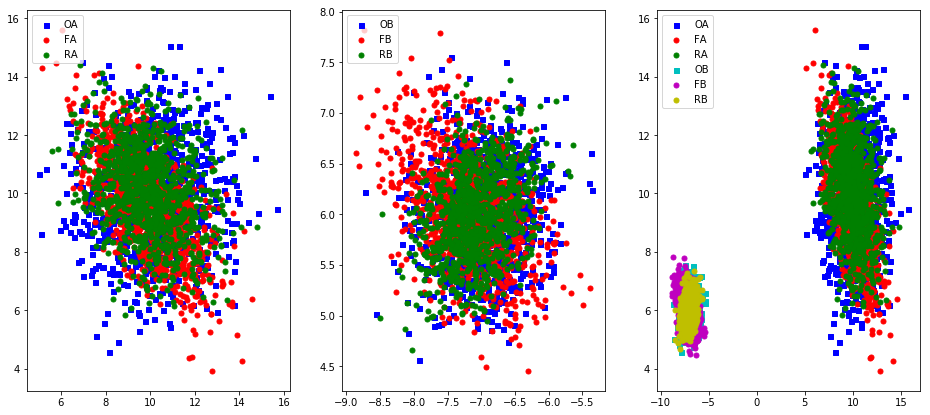

[Epoch 90/101] [Batch 983/1000] [D loss: 0.225295, acc: 100%] [G loss: 8.113509, adv: 3.374587, recon: 0.186080, id: 0.222874] time: 0:16:30.805705 


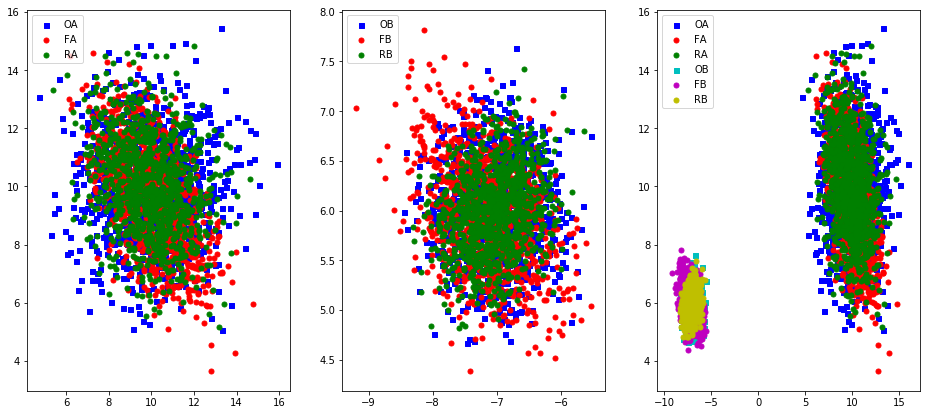

[Epoch 100/101] [Batch 983/1000] [D loss: 0.272194, acc: 100%] [G loss: 7.984256, adv: 3.418979, recon: 0.075832, id: 0.151899] time: 0:18:18.068402 


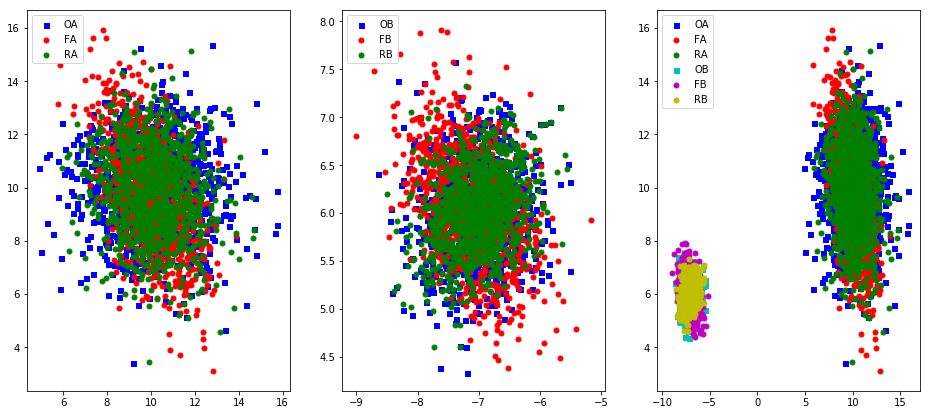

In [69]:
gan.train(epochs=101, batch_size=1, sample_interval=10)

In [70]:
gan = CycleGAN(data_A, data_B)

[Epoch 0/1001] [Batch 45/62] [D loss: 0.420251, acc:  93%] [G loss: 3.942744, adv: 1.795250, recon: 0.018596, id: 0.018638] time: 0:00:00.514359 


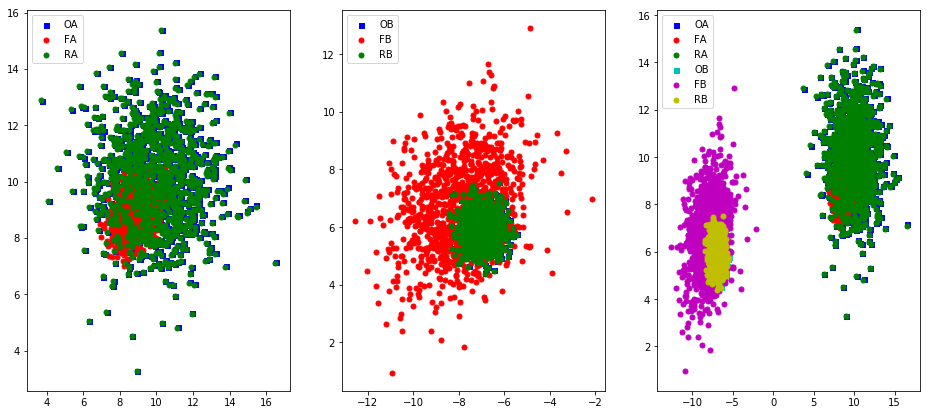

[Epoch 10/1001] [Batch 45/62] [D loss: 0.391286, acc:  95%] [G loss: 4.203745, adv: 1.917336, recon: 0.025228, id: 0.026728] time: 0:00:06.009610 


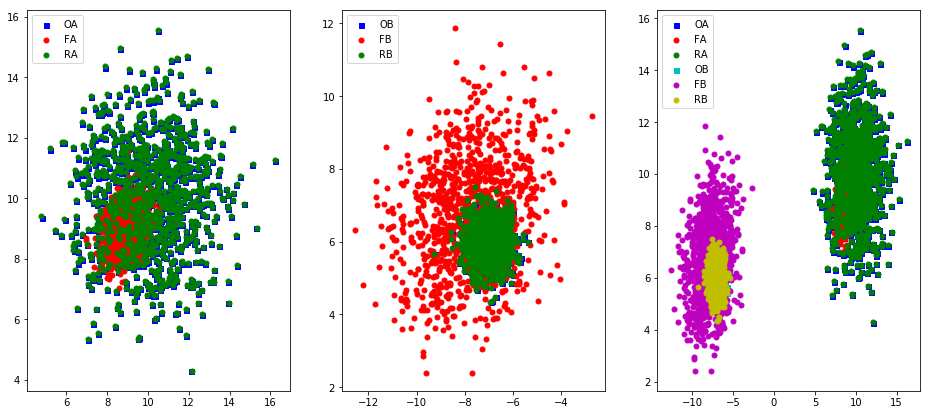

[Epoch 20/1001] [Batch 45/62] [D loss: 0.369081, acc:  95%] [G loss: 4.372327, adv: 2.012749, recon: 0.014800, id: 0.016038] time: 0:00:11.480690 


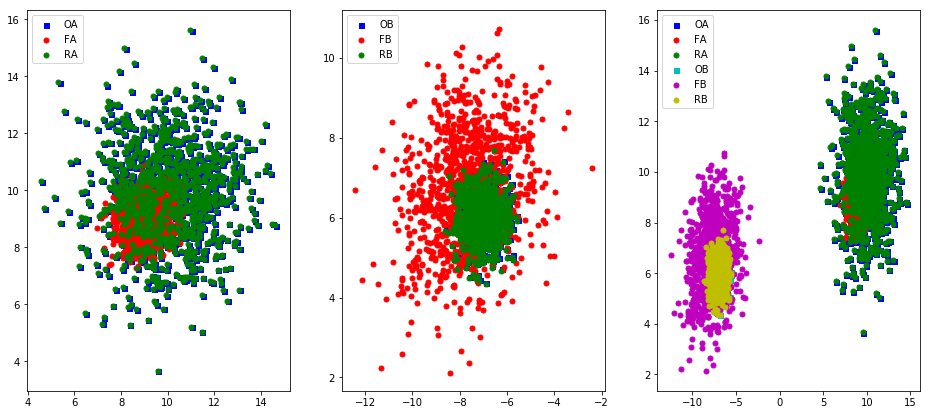

[Epoch 30/1001] [Batch 45/62] [D loss: 0.351630, acc:  95%] [G loss: 4.602944, adv: 2.117869, recon: 0.022867, id: 0.023560] time: 0:00:16.948126 


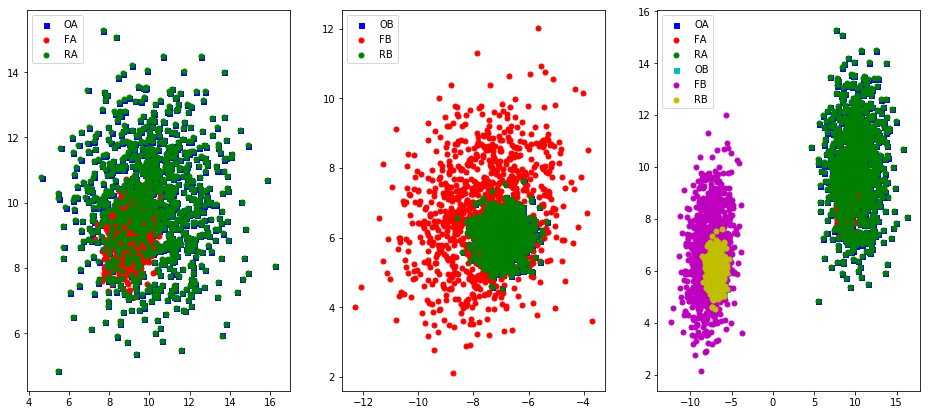

[Epoch 40/1001] [Batch 45/62] [D loss: 0.325706, acc:  95%] [G loss: 4.837460, adv: 2.245212, recon: 0.013837, id: 0.014254] time: 0:00:22.434039 


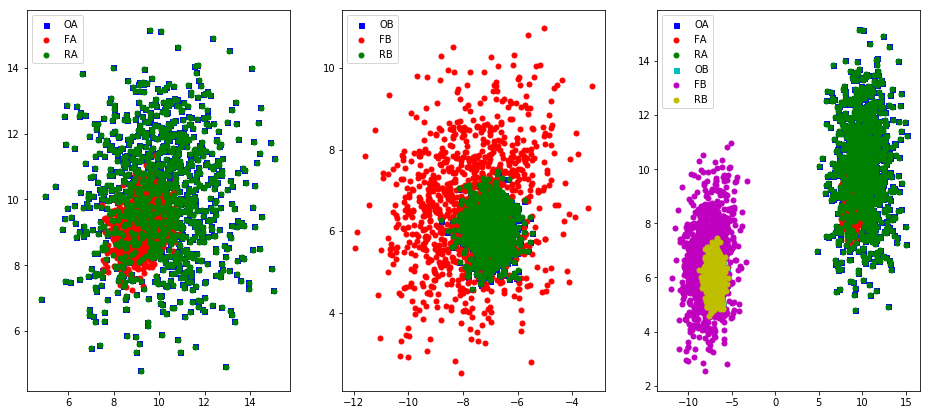

[Epoch 50/1001] [Batch 45/62] [D loss: 0.301738, acc:  95%] [G loss: 5.086445, adv: 2.363013, recon: 0.019751, id: 0.021265] time: 0:00:27.895058 


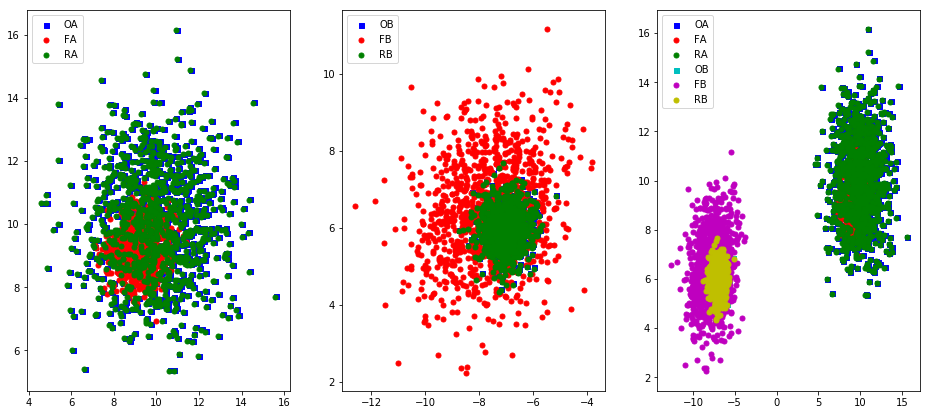

[Epoch 60/1001] [Batch 45/62] [D loss: 0.286211, acc:  96%] [G loss: 5.265970, adv: 2.451032, recon: 0.017673, id: 0.017849] time: 0:00:33.380576 


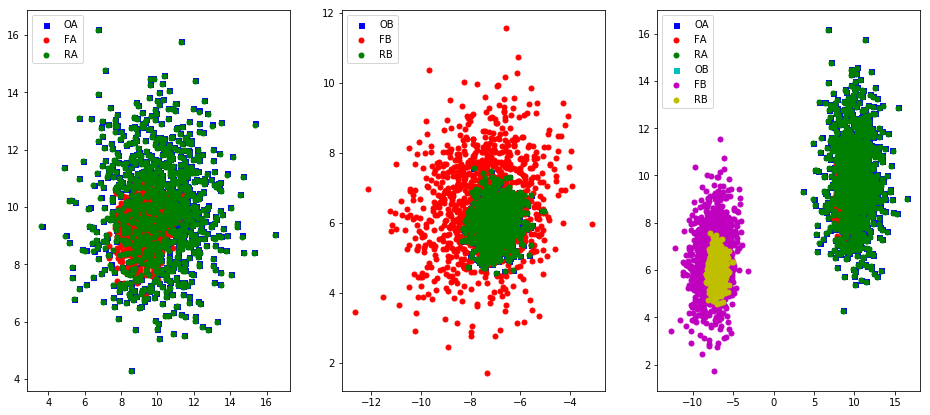

[Epoch 70/1001] [Batch 45/62] [D loss: 0.274080, acc:  96%] [G loss: 5.434374, adv: 2.525221, recon: 0.023035, id: 0.023356] time: 0:00:38.849740 


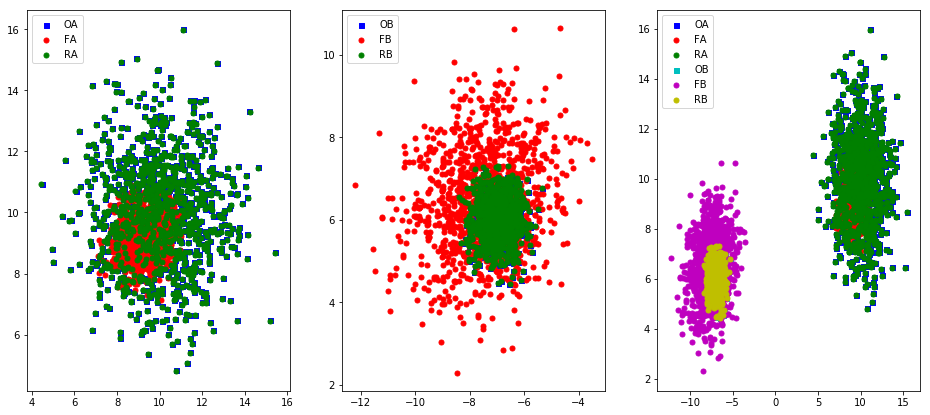

[Epoch 80/1001] [Batch 45/62] [D loss: 0.262012, acc:  96%] [G loss: 5.586758, adv: 2.594072, recon: 0.026865, id: 0.028960] time: 0:00:44.496400 


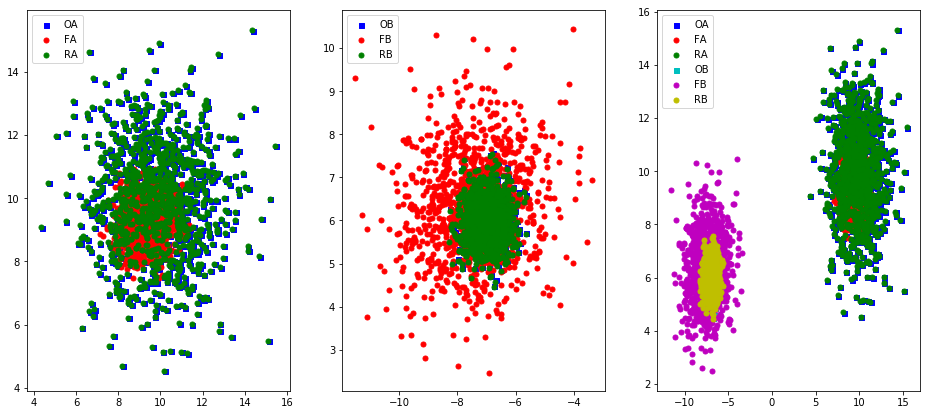

[Epoch 90/1001] [Batch 45/62] [D loss: 0.256237, acc:  96%] [G loss: 5.639307, adv: 2.642624, recon: 0.007109, id: 0.006680] time: 0:00:50.384342 


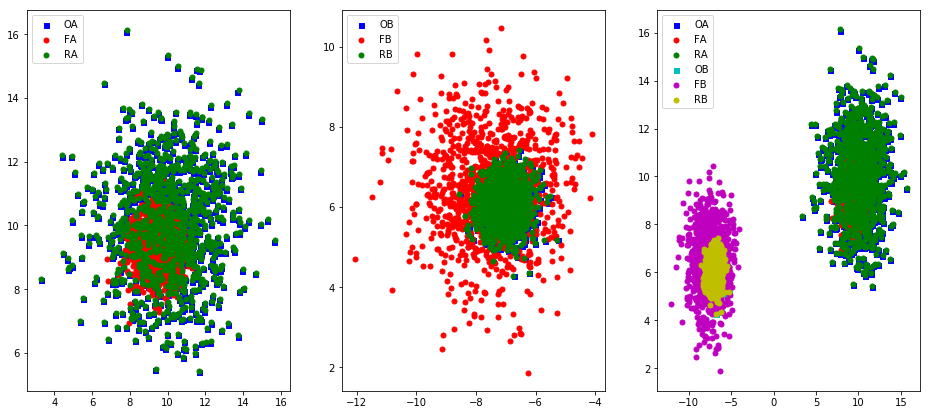

[Epoch 100/1001] [Batch 45/62] [D loss: 0.251168, acc:  96%] [G loss: 5.797912, adv: 2.704761, recon: 0.017379, id: 0.018751] time: 0:00:55.829514 


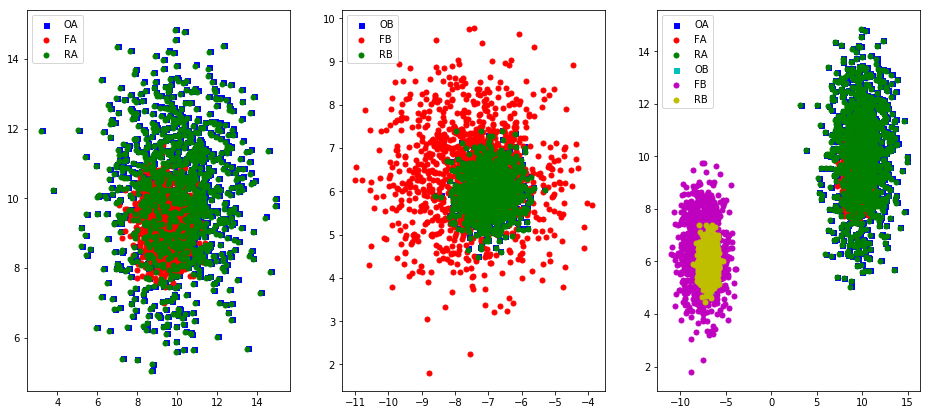

[Epoch 110/1001] [Batch 45/62] [D loss: 0.249481, acc:  96%] [G loss: 5.895952, adv: 2.727097, recon: 0.032491, id: 0.033453] time: 0:01:01.282770 


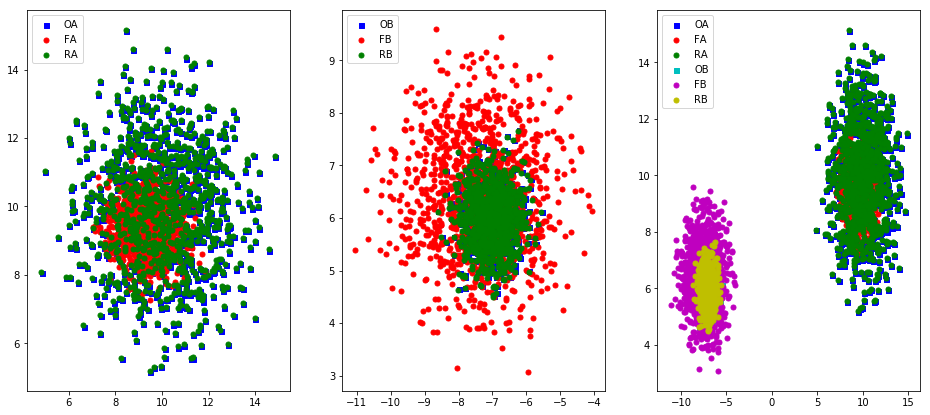

[Epoch 120/1001] [Batch 45/62] [D loss: 0.248334, acc: 100%] [G loss: 5.881819, adv: 2.752492, recon: 0.003923, id: 0.004707] time: 0:01:06.735162 


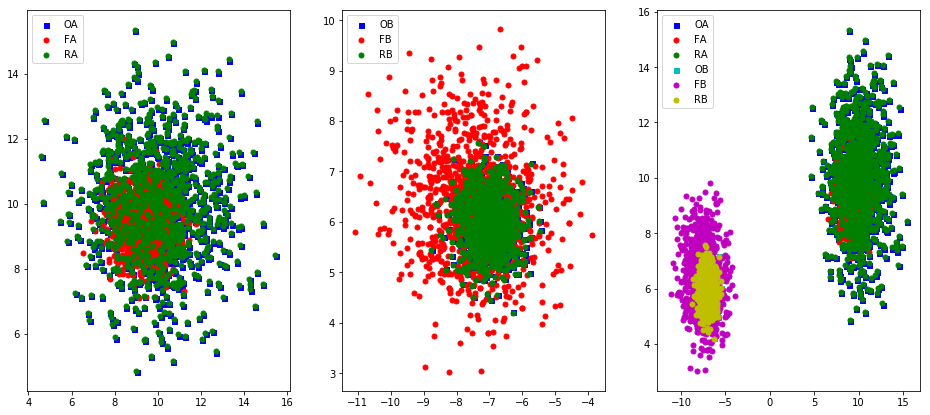

[Epoch 130/1001] [Batch 45/62] [D loss: 0.249701, acc: 100%] [G loss: 5.971186, adv: 2.753119, recon: 0.031243, id: 0.031088] time: 0:01:12.202058 


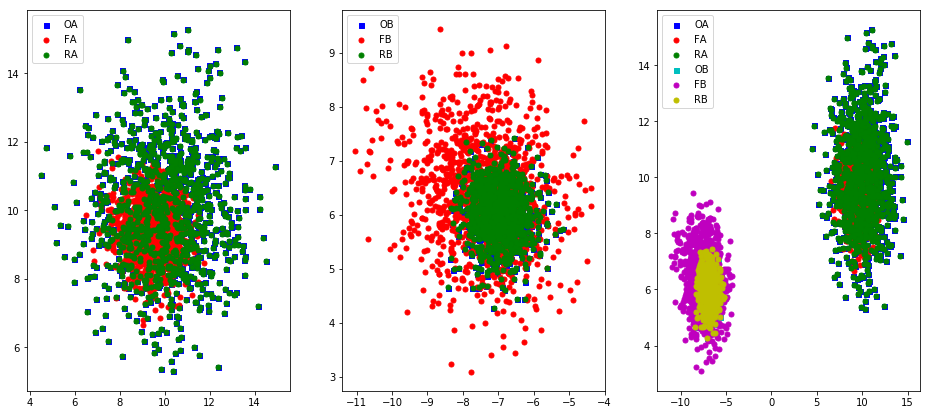

[Epoch 140/1001] [Batch 45/62] [D loss: 0.250561, acc: 100%] [G loss: 5.926237, adv: 2.753159, recon: 0.007556, id: 0.007762] time: 0:01:17.642636 


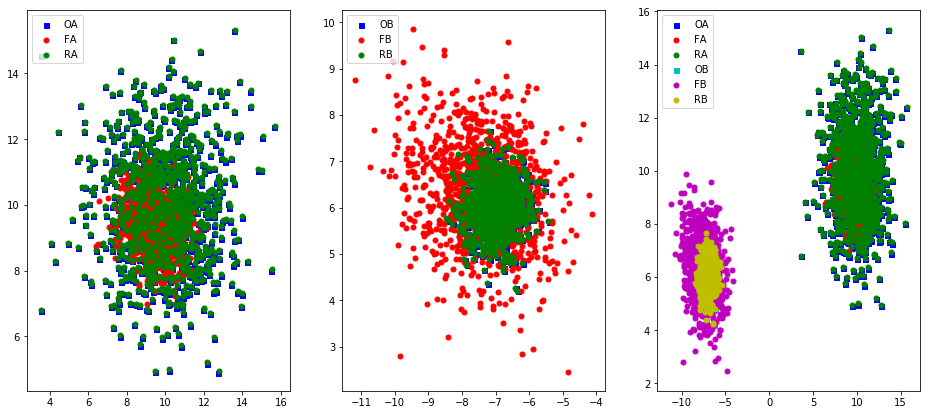

[Epoch 150/1001] [Batch 45/62] [D loss: 0.254983, acc:  98%] [G loss: 5.924786, adv: 2.735893, recon: 0.015710, id: 0.018447] time: 0:01:23.104007 


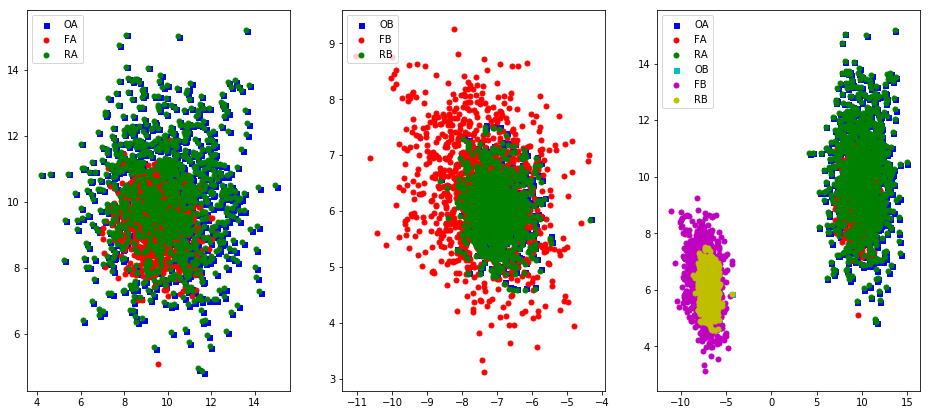

[Epoch 160/1001] [Batch 45/62] [D loss: 0.260880, acc:  95%] [G loss: 5.904817, adv: 2.711671, recon: 0.015888, id: 0.014941] time: 0:01:28.560650 


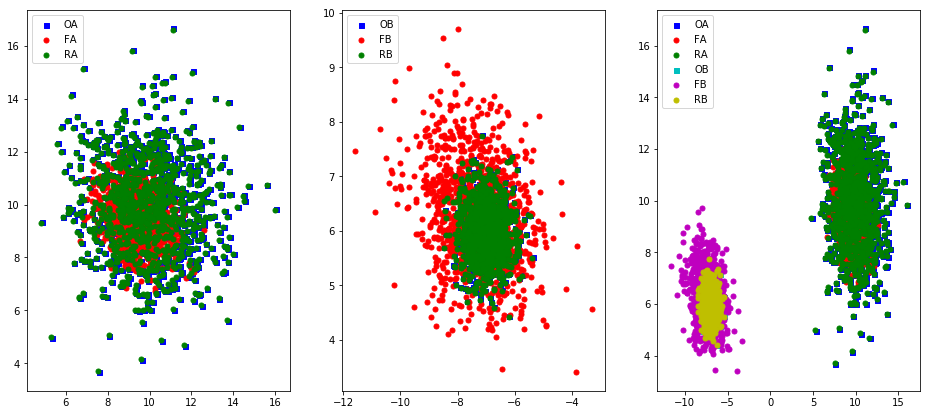

[Epoch 170/1001] [Batch 45/62] [D loss: 0.266619, acc:  93%] [G loss: 5.931579, adv: 2.686279, recon: 0.046347, id: 0.050758] time: 0:01:33.978644 


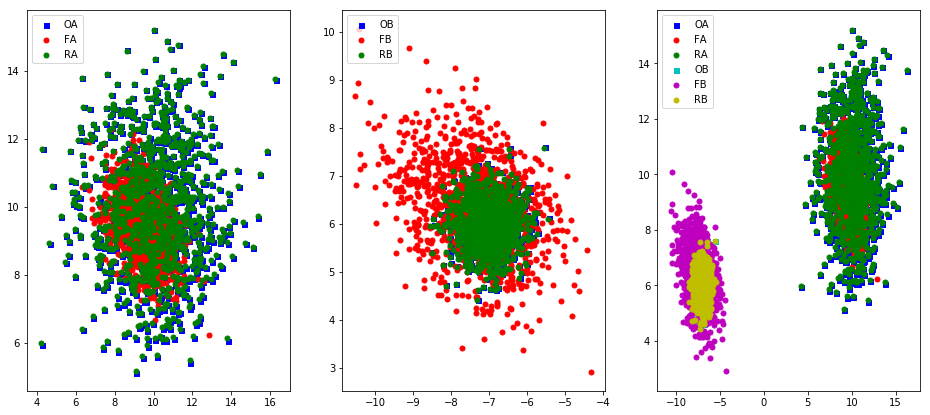

[Epoch 180/1001] [Batch 45/62] [D loss: 0.275801, acc:  93%] [G loss: 5.820677, adv: 2.653106, recon: 0.016860, id: 0.019559] time: 0:01:39.440766 


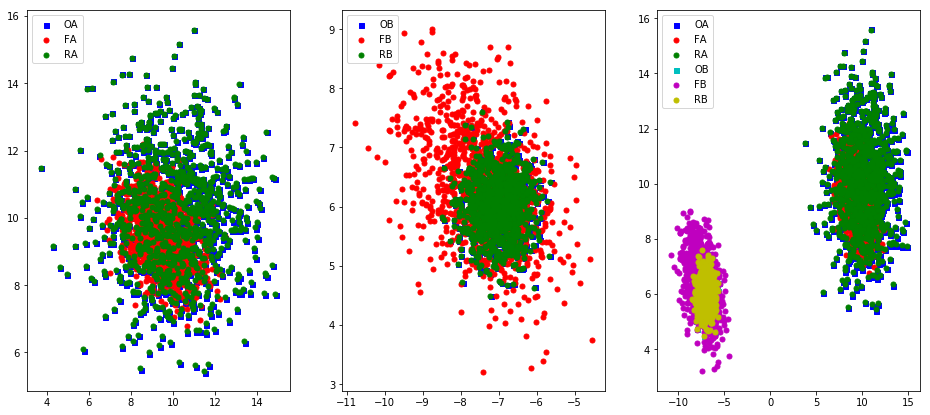

[Epoch 190/1001] [Batch 45/62] [D loss: 0.283696, acc:  93%] [G loss: 5.793054, adv: 2.619314, recon: 0.027060, id: 0.031006] time: 0:01:45.174882 


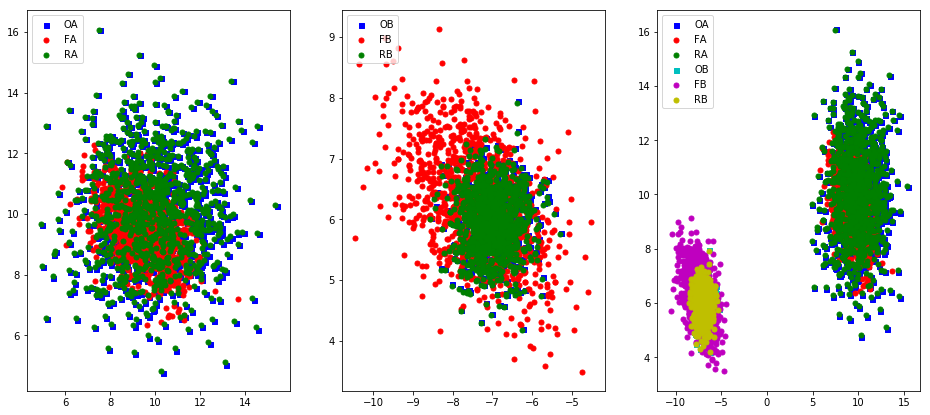

[Epoch 200/1001] [Batch 45/62] [D loss: 0.291949, acc:  93%] [G loss: 5.792878, adv: 2.583638, recon: 0.050607, id: 0.055625] time: 0:01:50.987483 


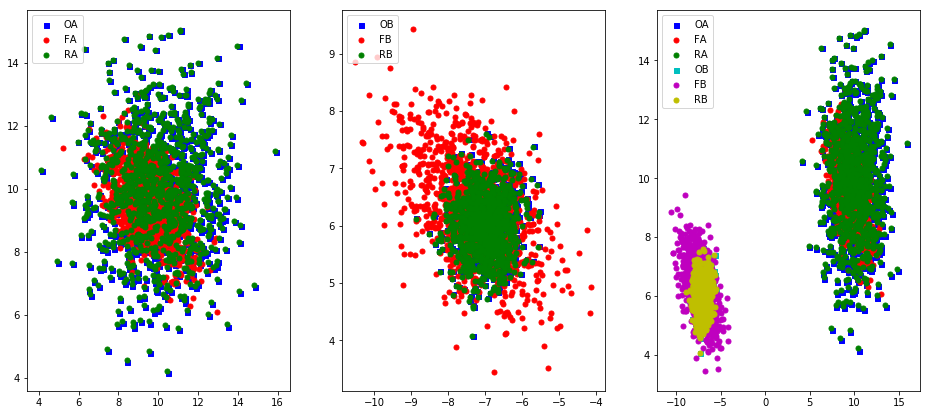

[Epoch 210/1001] [Batch 45/62] [D loss: 0.302694, acc:  92%] [G loss: 5.728721, adv: 2.542679, recon: 0.045998, id: 0.045163] time: 0:01:56.442540 


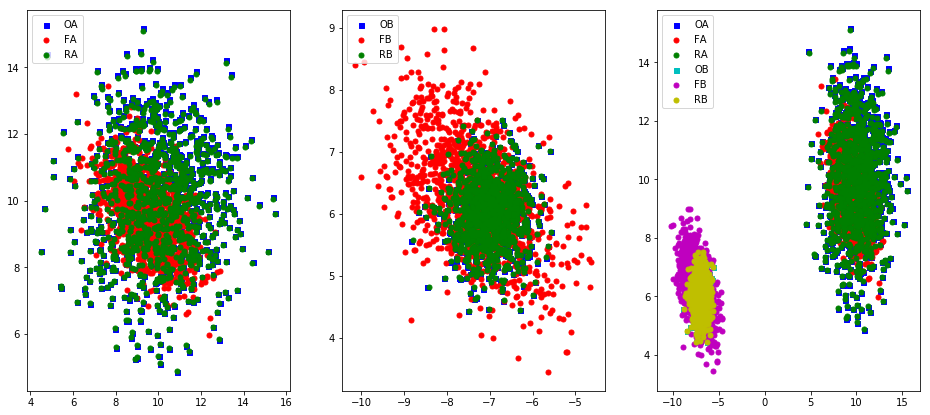

[Epoch 220/1001] [Batch 45/62] [D loss: 0.310195, acc:  92%] [G loss: 5.679011, adv: 2.508183, recon: 0.050041, id: 0.055216] time: 0:02:01.901602 


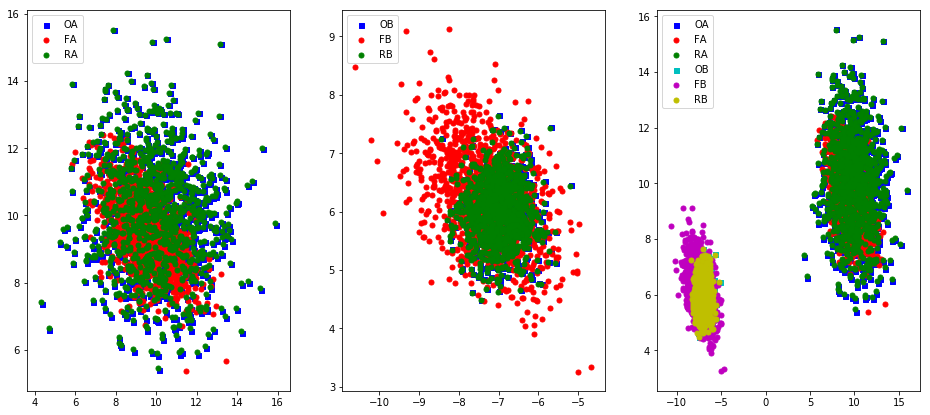

[Epoch 230/1001] [Batch 45/62] [D loss: 0.318527, acc:  92%] [G loss: 5.600199, adv: 2.471320, recon: 0.038284, id: 0.043172] time: 0:02:07.362404 


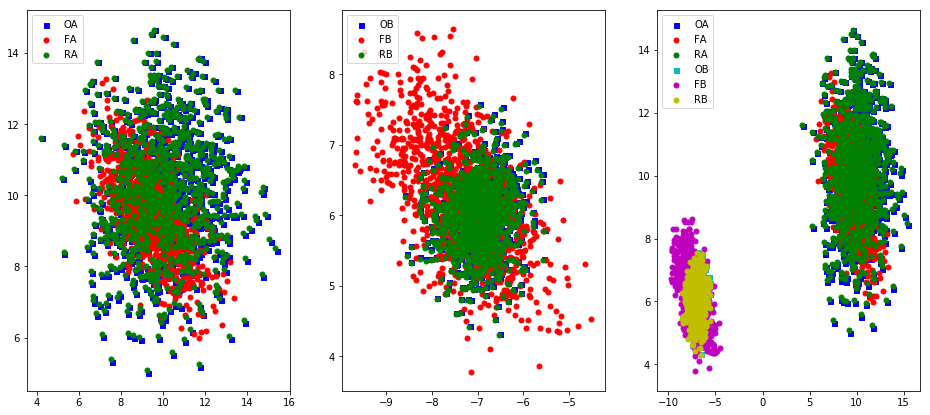

[Epoch 240/1001] [Batch 45/62] [D loss: 0.327355, acc:  92%] [G loss: 5.566712, adv: 2.434571, recon: 0.048514, id: 0.054014] time: 0:02:12.809373 


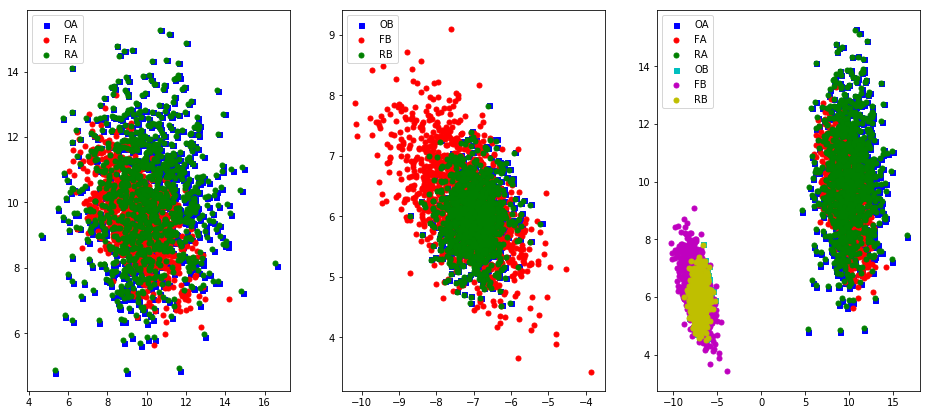

[Epoch 250/1001] [Batch 45/62] [D loss: 0.336428, acc:  90%] [G loss: 5.474787, adv: 2.400633, recon: 0.023724, id: 0.020813] time: 0:02:18.279493 


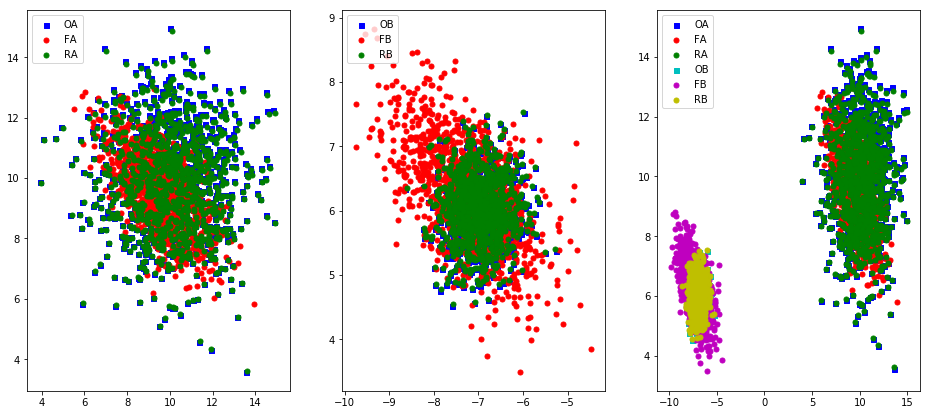

[Epoch 260/1001] [Batch 45/62] [D loss: 0.342149, acc:  89%] [G loss: 5.484760, adv: 2.375726, recon: 0.048226, id: 0.054049] time: 0:02:23.742550 


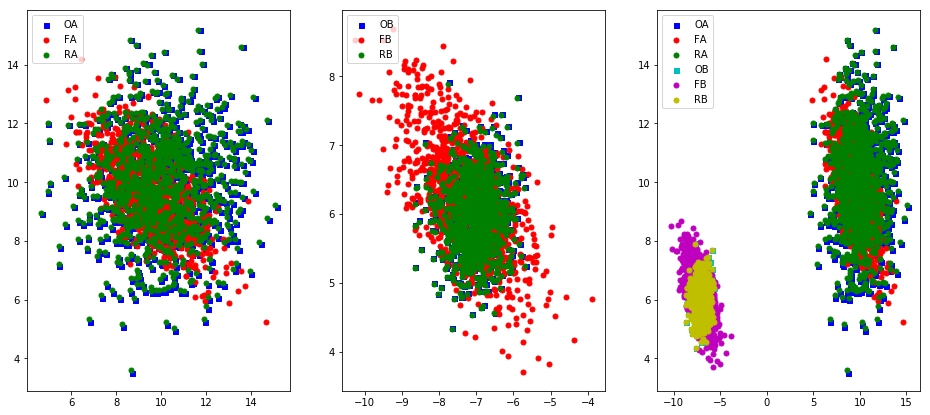

[Epoch 270/1001] [Batch 45/62] [D loss: 0.347706, acc:  87%] [G loss: 5.453655, adv: 2.355402, recon: 0.044414, id: 0.050172] time: 0:02:29.202363 


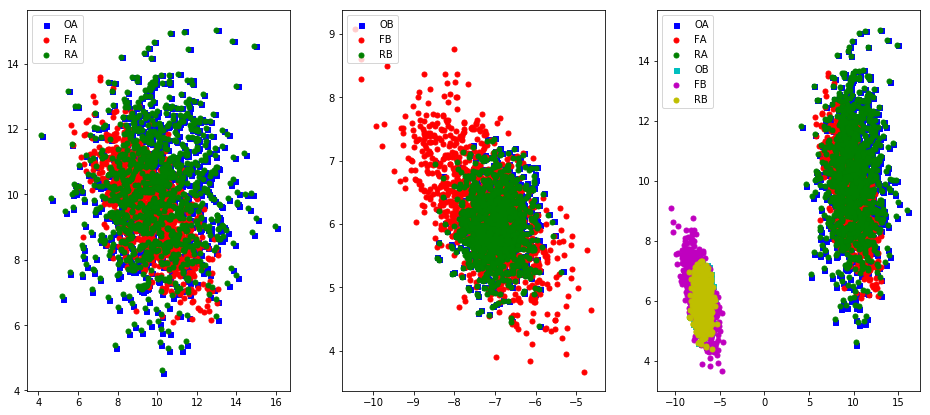

[Epoch 280/1001] [Batch 45/62] [D loss: 0.350863, acc:  87%] [G loss: 5.442975, adv: 2.343291, recon: 0.043052, id: 0.048819] time: 0:02:34.654831 


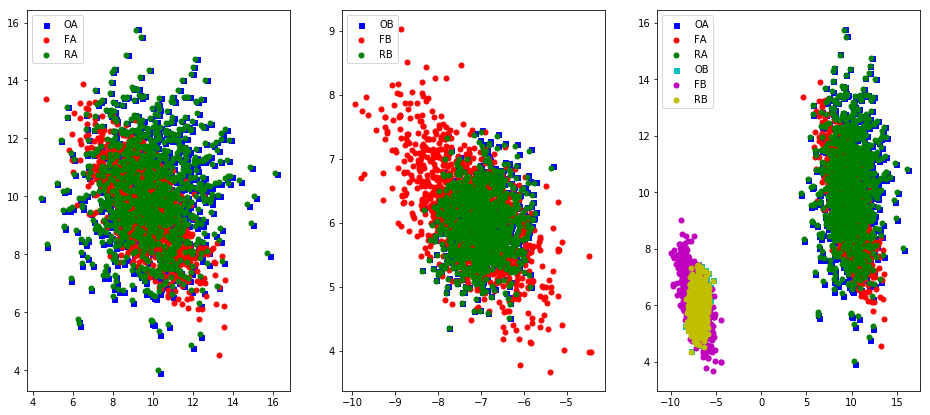

[Epoch 290/1001] [Batch 45/62] [D loss: 0.351739, acc:  90%] [G loss: 5.454903, adv: 2.341249, recon: 0.043295, id: 0.049045] time: 0:02:40.116874 


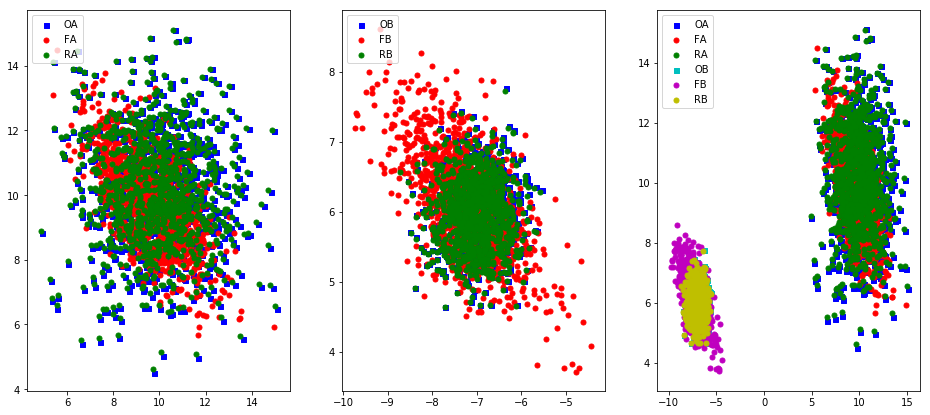

[Epoch 300/1001] [Batch 45/62] [D loss: 0.350937, acc:  89%] [G loss: 5.468027, adv: 2.341731, recon: 0.041882, id: 0.047750] time: 0:02:45.953868 


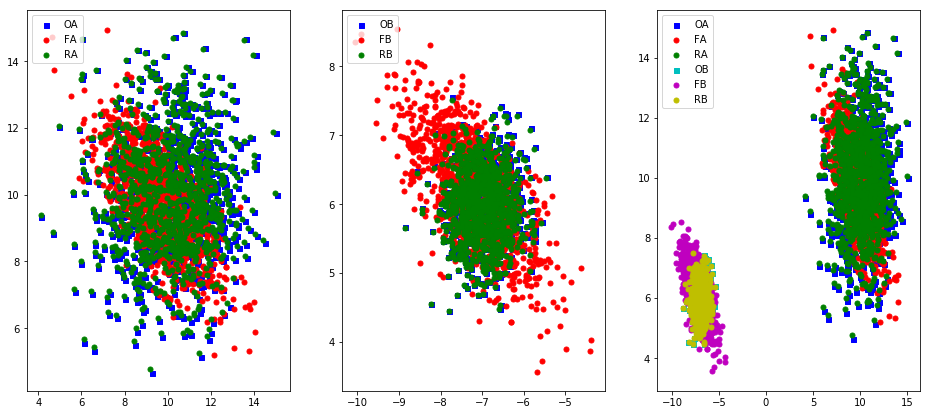

[Epoch 310/1001] [Batch 45/62] [D loss: 0.348622, acc:  89%] [G loss: 5.495008, adv: 2.346555, recon: 0.043504, id: 0.049564] time: 0:02:51.664528 


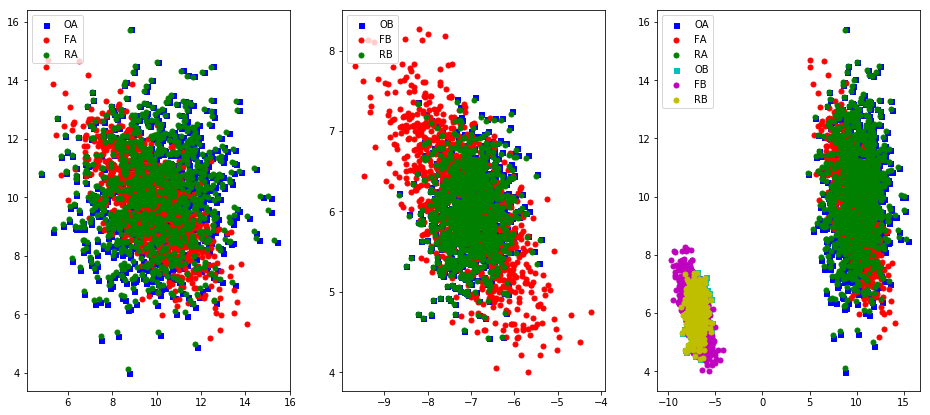

[Epoch 320/1001] [Batch 45/62] [D loss: 0.345852, acc:  89%] [G loss: 5.536677, adv: 2.359471, recon: 0.044731, id: 0.050759] time: 0:02:57.127017 


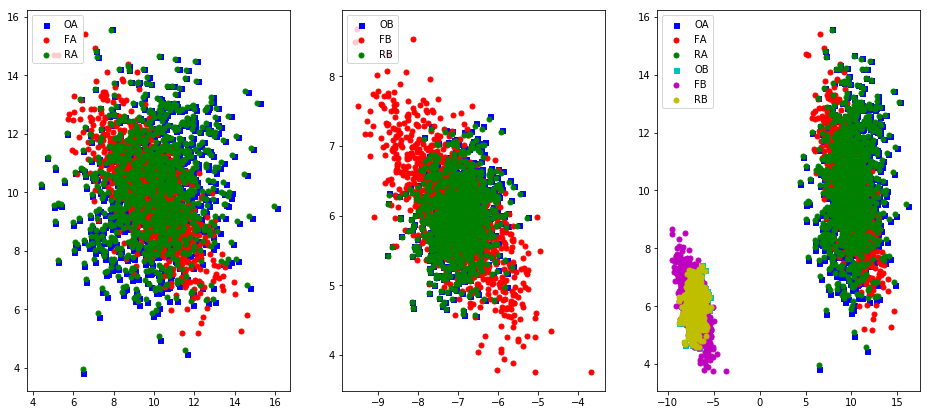

[Epoch 330/1001] [Batch 45/62] [D loss: 0.341389, acc:  90%] [G loss: 5.600585, adv: 2.383471, recon: 0.046430, id: 0.052297] time: 0:03:02.597232 


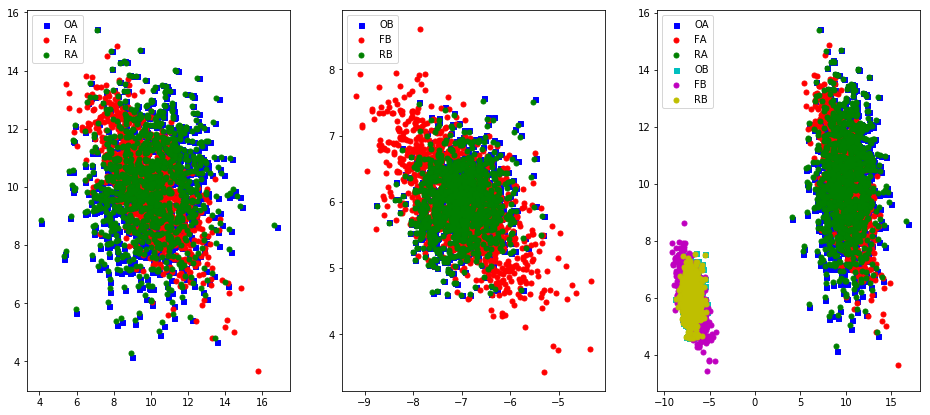

[Epoch 340/1001] [Batch 45/62] [D loss: 0.336523, acc:  90%] [G loss: 5.647414, adv: 2.399949, recon: 0.047509, id: 0.053270] time: 0:03:08.055149 


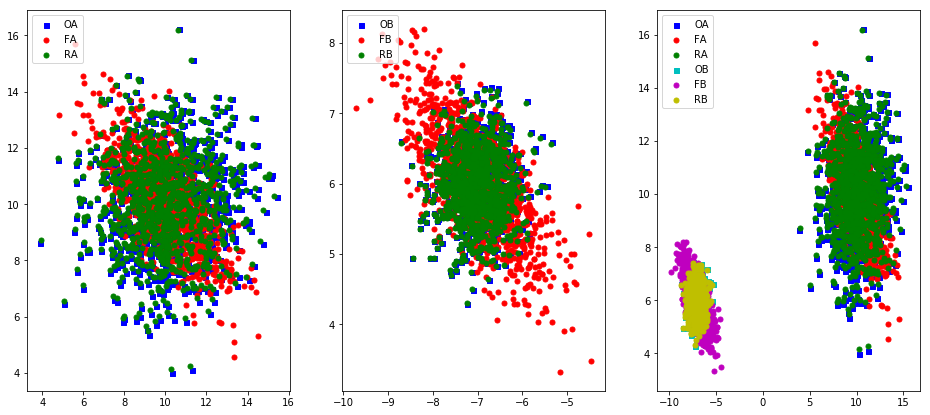

[Epoch 350/1001] [Batch 45/62] [D loss: 0.332218, acc:  90%] [G loss: 5.734485, adv: 2.438607, recon: 0.047127, id: 0.052497] time: 0:03:13.523407 


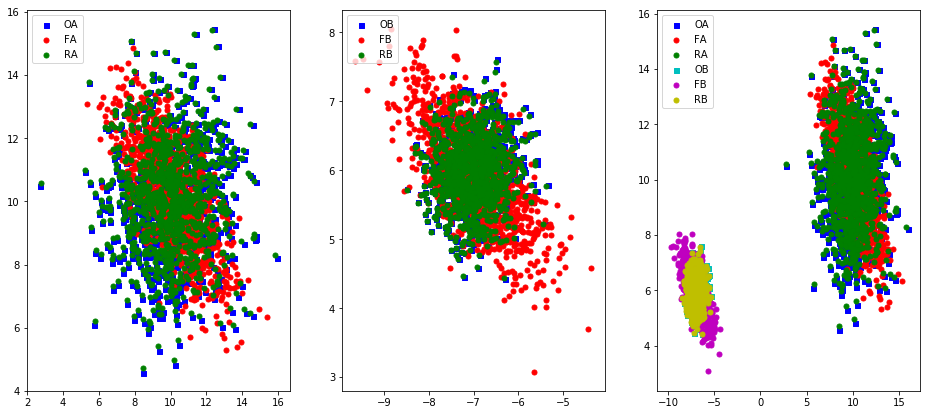

[Epoch 360/1001] [Batch 45/62] [D loss: 0.326460, acc:  89%] [G loss: 5.837679, adv: 2.485447, recon: 0.047156, id: 0.052088] time: 0:03:19.013142 


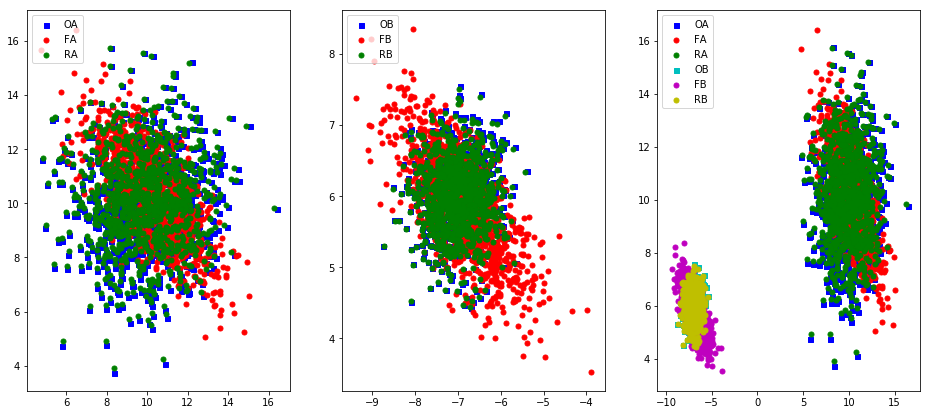

[Epoch 370/1001] [Batch 45/62] [D loss: 0.319783, acc:  89%] [G loss: 5.932941, adv: 2.527172, recon: 0.048745, id: 0.053348] time: 0:03:24.497090 


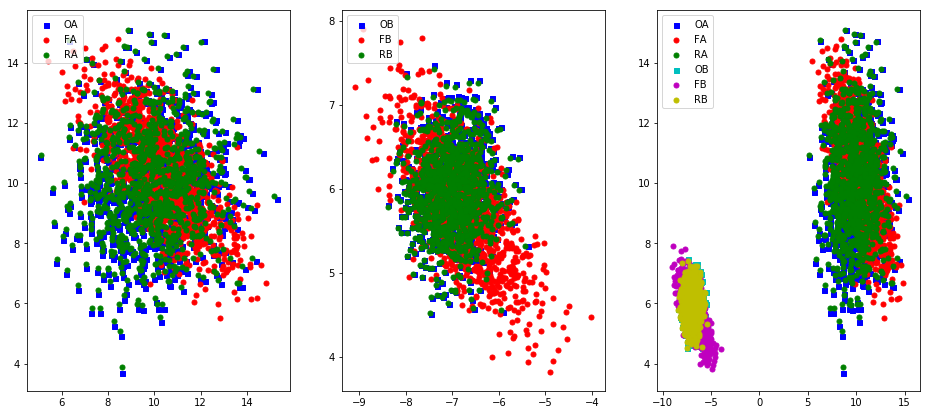

[Epoch 380/1001] [Batch 45/62] [D loss: 0.313498, acc:  87%] [G loss: 6.024317, adv: 2.568354, recon: 0.049213, id: 0.053774] time: 0:03:29.981230 


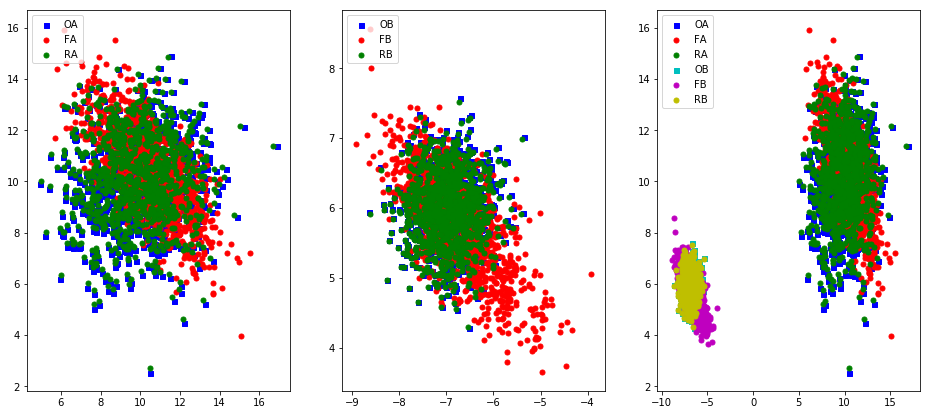

[Epoch 390/1001] [Batch 45/62] [D loss: 0.307707, acc:  87%] [G loss: 6.117589, adv: 2.610645, recon: 0.050039, id: 0.054639] time: 0:03:35.459333 


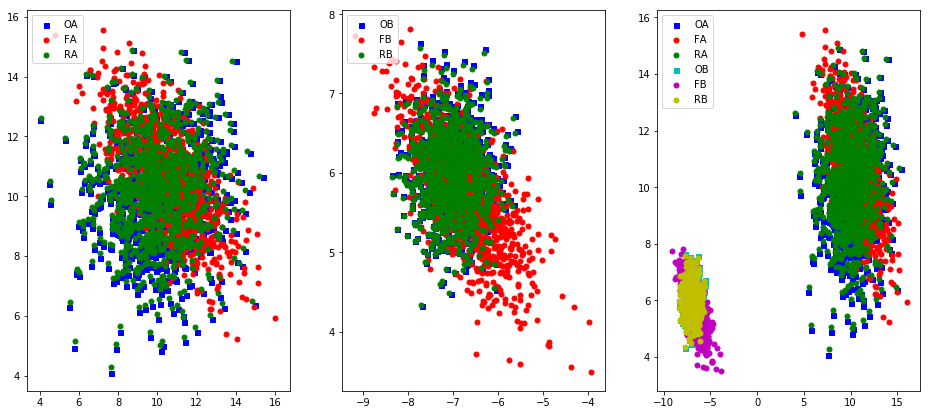

[Epoch 400/1001] [Batch 45/62] [D loss: 0.302597, acc:  87%] [G loss: 6.216004, adv: 2.655839, recon: 0.051090, id: 0.055610] time: 0:03:40.922949 


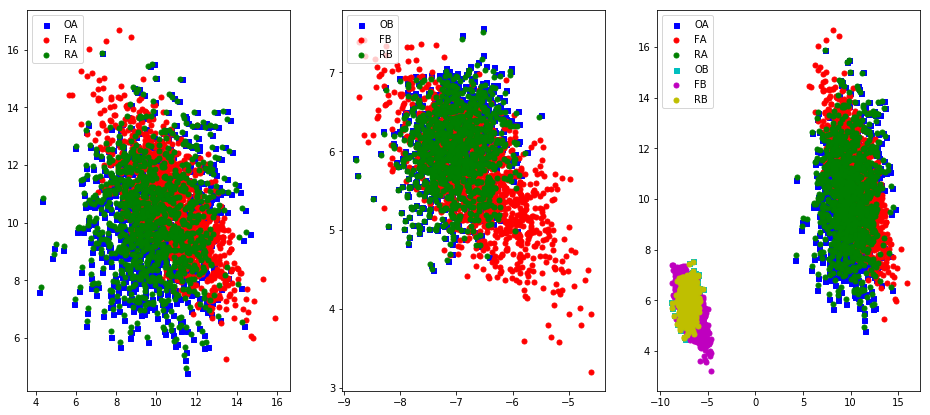

[Epoch 410/1001] [Batch 45/62] [D loss: 0.298335, acc:  87%] [G loss: 6.318217, adv: 2.703223, recon: 0.052439, id: 0.056871] time: 0:03:46.789638 


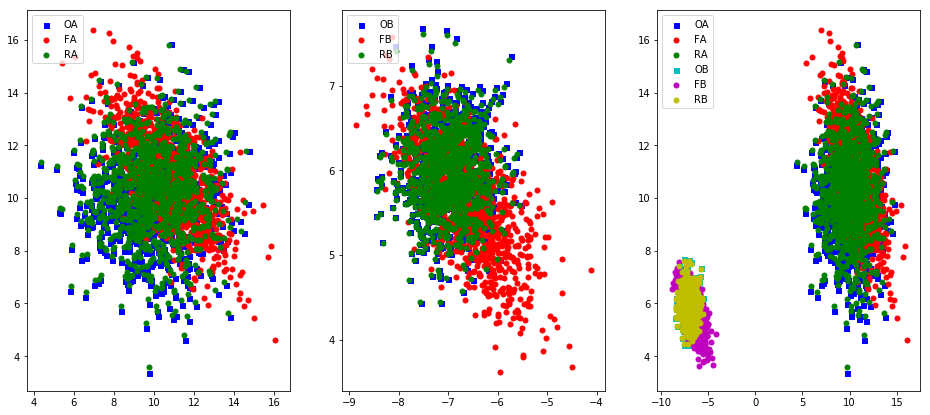

[Epoch 420/1001] [Batch 45/62] [D loss: 0.294799, acc:  87%] [G loss: 6.416966, adv: 2.748687, recon: 0.054455, id: 0.058988] time: 0:03:52.523808 


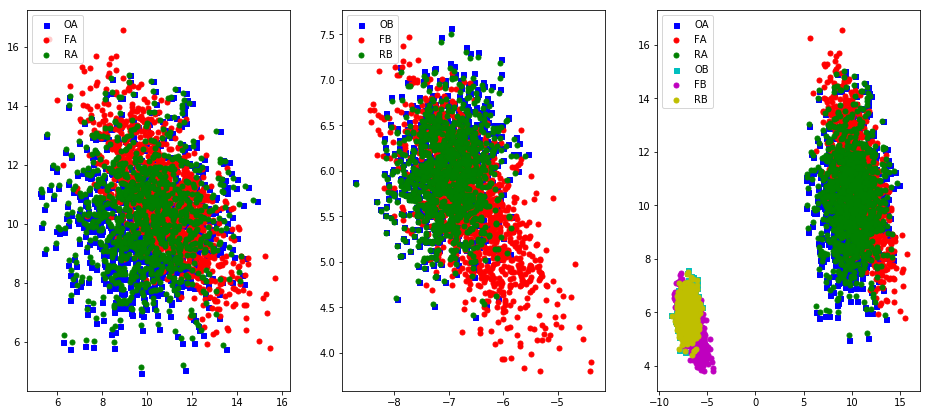

[Epoch 430/1001] [Batch 45/62] [D loss: 0.292080, acc:  87%] [G loss: 6.511384, adv: 2.792581, recon: 0.056468, id: 0.061074] time: 0:03:58.016465 


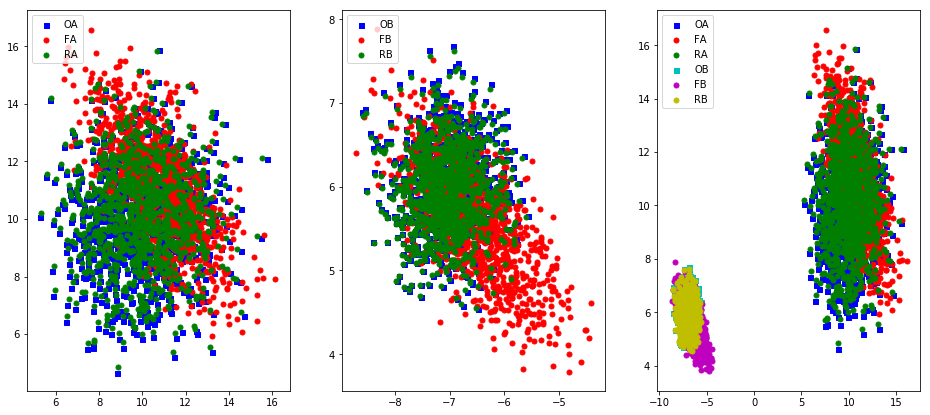

[Epoch 440/1001] [Batch 45/62] [D loss: 0.290146, acc:  87%] [G loss: 6.600860, adv: 2.834585, recon: 0.058388, id: 0.063242] time: 0:04:03.503539 


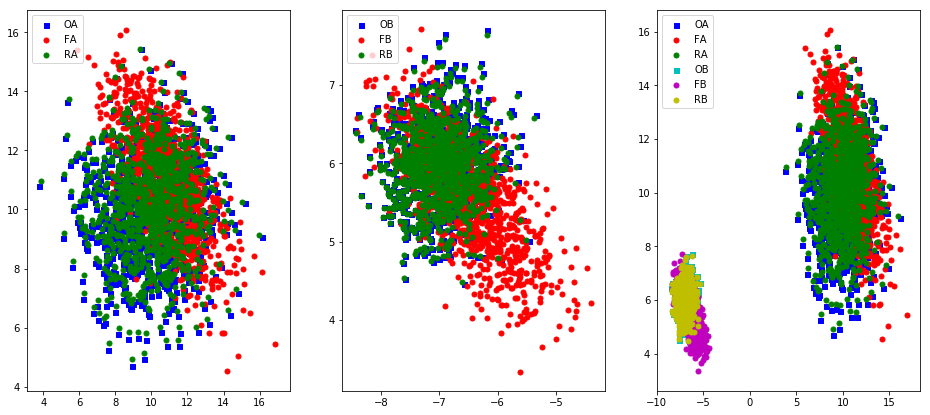

[Epoch 450/1001] [Batch 45/62] [D loss: 0.289079, acc:  87%] [G loss: 6.682524, adv: 2.874101, recon: 0.059498, id: 0.064569] time: 0:04:10.387586 


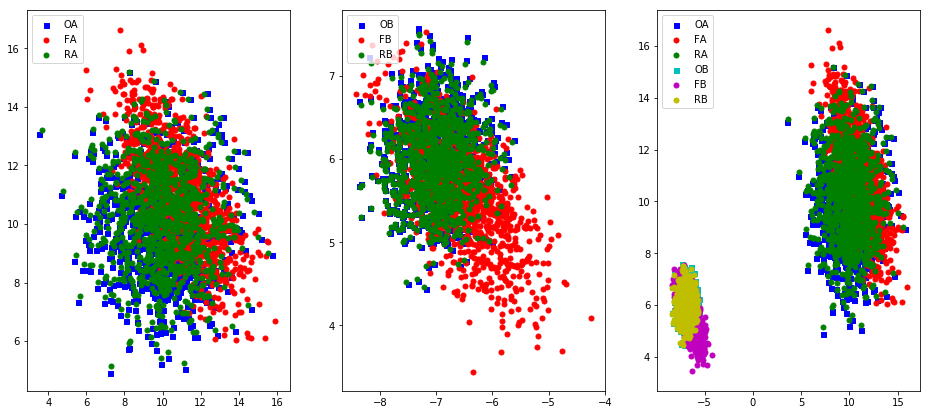

[Epoch 460/1001] [Batch 45/62] [D loss: 0.288876, acc:  87%] [G loss: 6.755476, adv: 2.910203, recon: 0.060343, id: 0.065615] time: 0:04:15.979269 


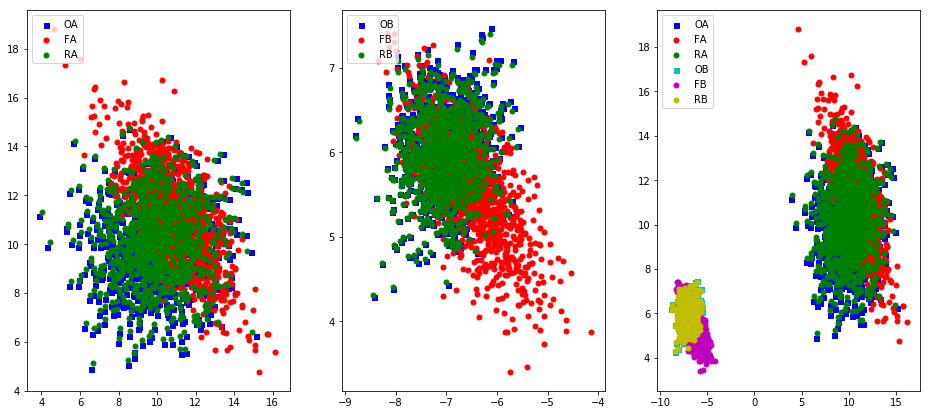

[Epoch 470/1001] [Batch 45/62] [D loss: 0.289520, acc:  87%] [G loss: 6.819567, adv: 2.941737, recon: 0.061972, id: 0.067613] time: 0:04:21.503217 


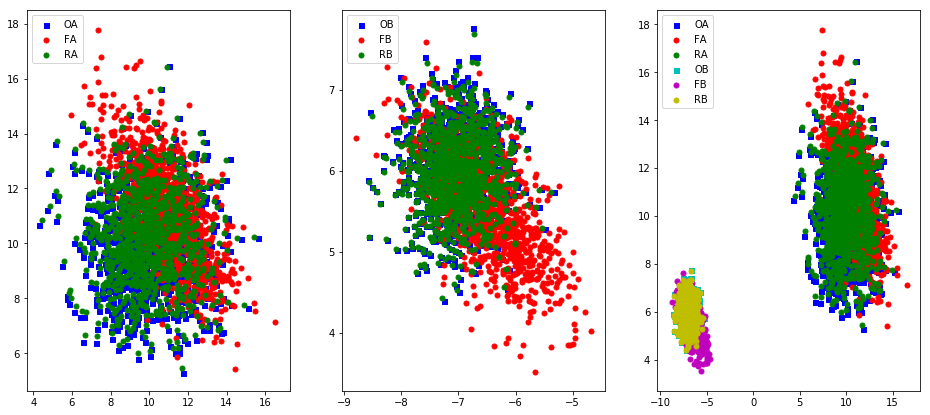

[Epoch 480/1001] [Batch 45/62] [D loss: 0.291066, acc:  87%] [G loss: 6.871583, adv: 2.967918, recon: 0.063691, id: 0.069873] time: 0:04:27.019984 


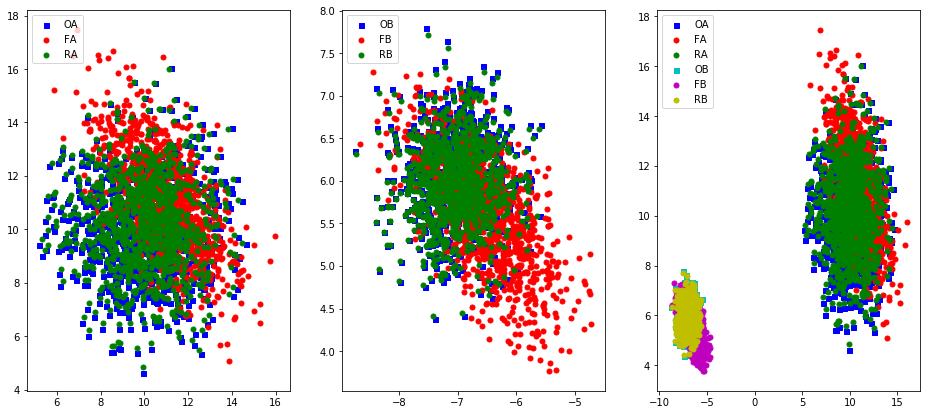

[Epoch 490/1001] [Batch 45/62] [D loss: 0.293664, acc:  87%] [G loss: 6.907288, adv: 2.987187, recon: 0.065031, id: 0.071502] time: 0:04:32.564128 


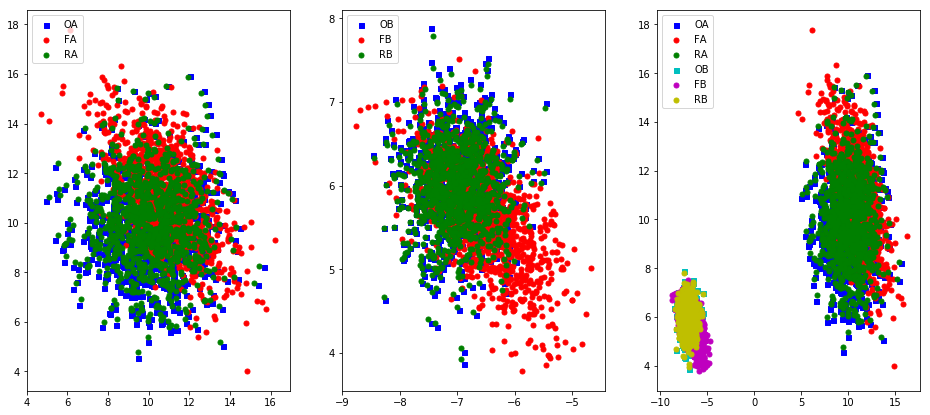

[Epoch 500/1001] [Batch 45/62] [D loss: 0.297202, acc:  87%] [G loss: 6.929179, adv: 2.997975, recon: 0.068716, id: 0.075855] time: 0:04:38.099067 


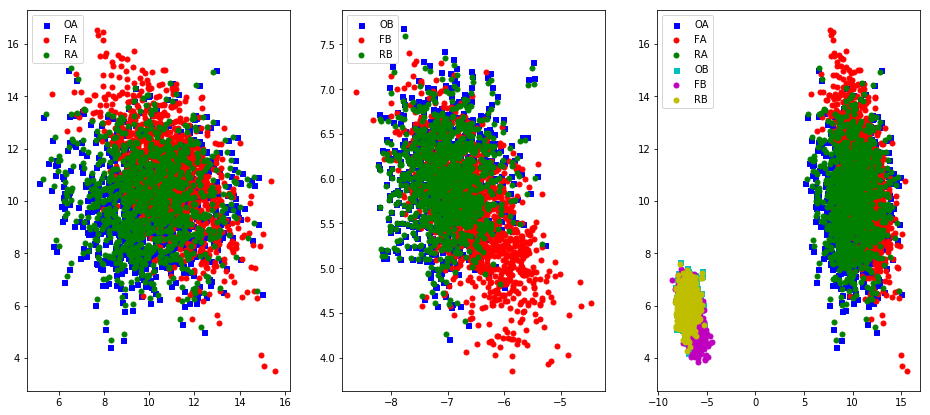

[Epoch 510/1001] [Batch 45/62] [D loss: 0.302040, acc:  87%] [G loss: 6.925907, adv: 2.998554, recon: 0.070918, id: 0.078394] time: 0:04:43.764007 


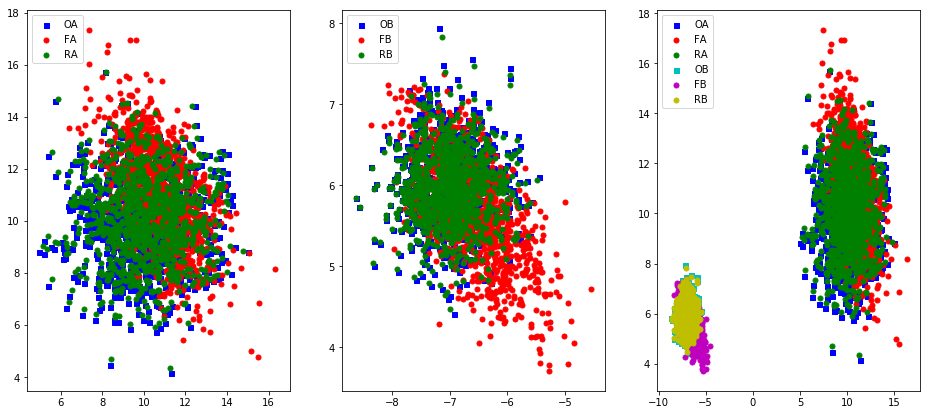

[Epoch 520/1001] [Batch 45/62] [D loss: 0.308495, acc:  89%] [G loss: 6.896746, adv: 2.986449, recon: 0.073906, id: 0.081714] time: 0:04:49.813396 


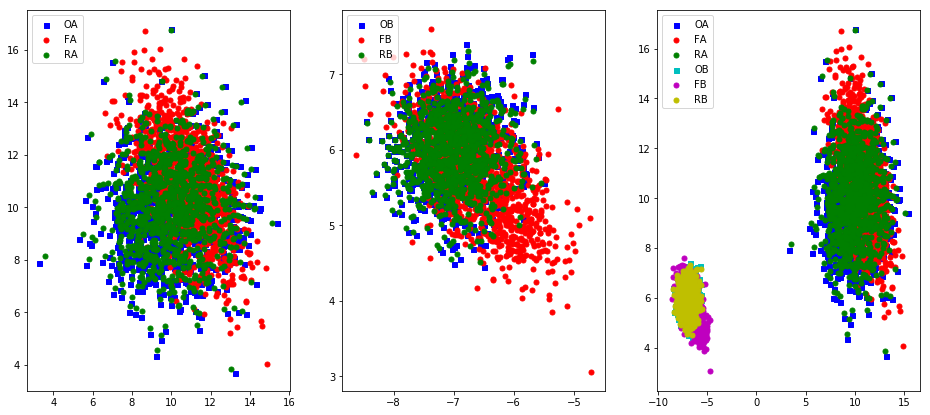

[Epoch 530/1001] [Batch 45/62] [D loss: 0.317169, acc:  89%] [G loss: 6.834468, adv: 2.957671, recon: 0.078729, id: 0.086181] time: 0:04:55.327998 


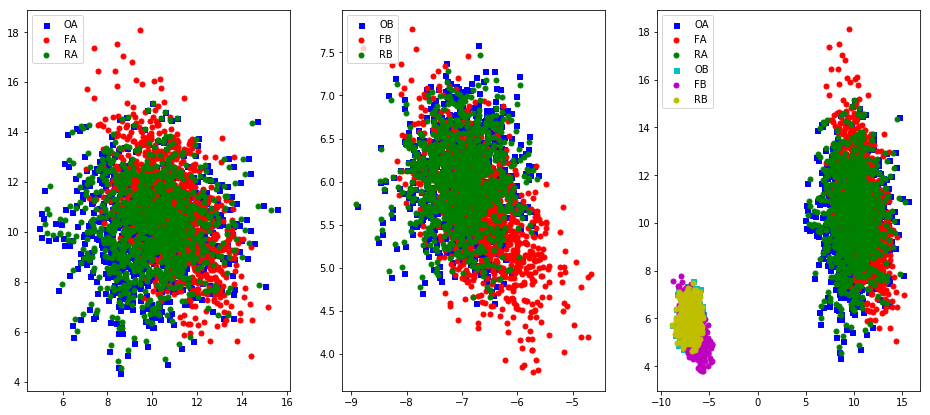

[Epoch 540/1001] [Batch 45/62] [D loss: 0.329629, acc:  89%] [G loss: 6.728022, adv: 2.905563, recon: 0.086394, id: 0.093350] time: 0:05:00.865930 


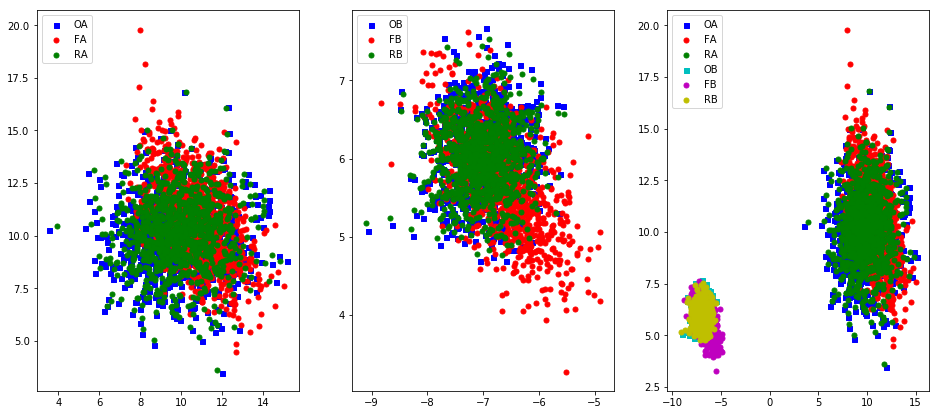

[Epoch 550/1001] [Batch 45/62] [D loss: 0.349116, acc:  89%] [G loss: 6.568061, adv: 2.821285, recon: 0.101056, id: 0.105178] time: 0:05:06.363484 


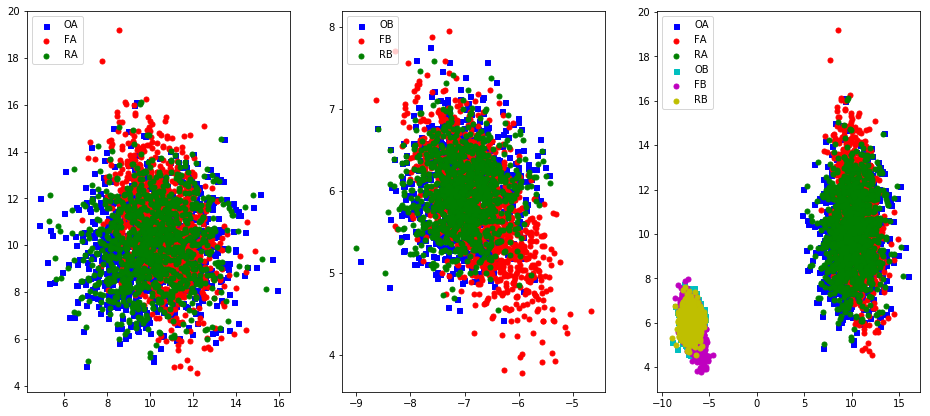

[Epoch 560/1001] [Batch 45/62] [D loss: 0.380342, acc:  84%] [G loss: 6.347775, adv: 2.694883, recon: 0.126697, id: 0.122012] time: 0:05:11.843274 


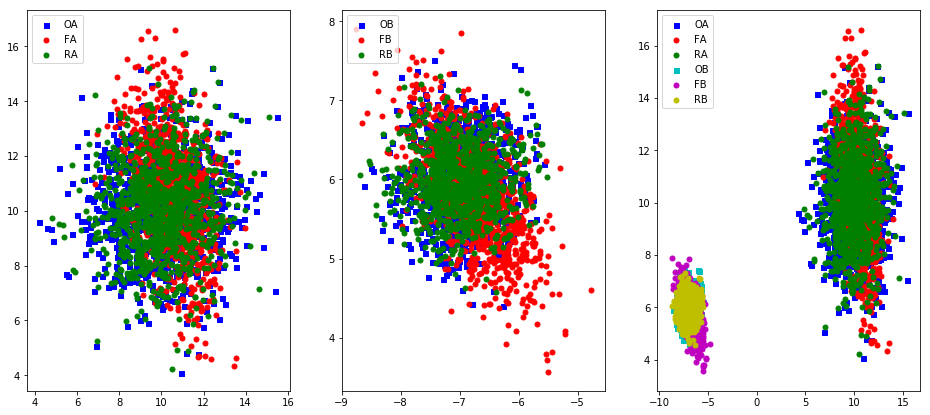

[Epoch 570/1001] [Batch 45/62] [D loss: 0.424286, acc:  81%] [G loss: 6.097479, adv: 2.531368, recon: 0.165233, id: 0.150932] time: 0:05:17.283465 


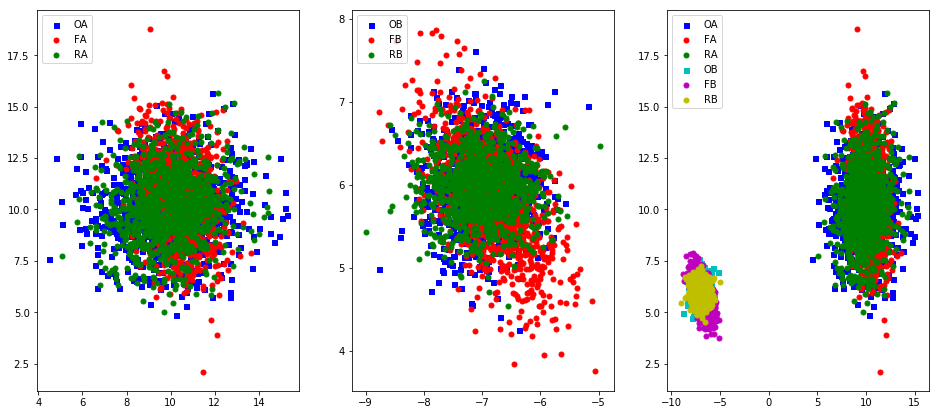

[Epoch 580/1001] [Batch 45/62] [D loss: 0.473747, acc:  78%] [G loss: 5.864741, adv: 2.350858, recon: 0.214386, id: 0.187132] time: 0:05:22.728161 


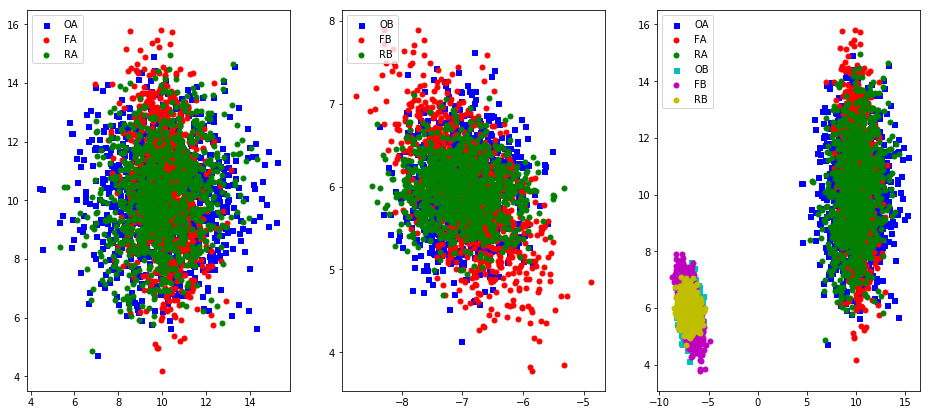

[Epoch 590/1001] [Batch 45/62] [D loss: 0.517443, acc:  76%] [G loss: 5.661205, adv: 2.166575, recon: 0.271254, id: 0.231233] time: 0:05:28.180533 


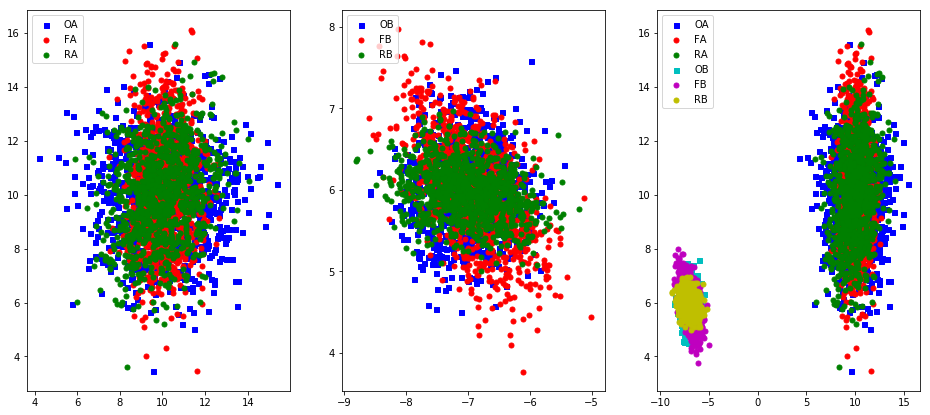

[Epoch 600/1001] [Batch 45/62] [D loss: 0.547218, acc:  75%] [G loss: 5.439522, adv: 1.978695, recon: 0.319763, id: 0.267041] time: 0:05:33.629467 


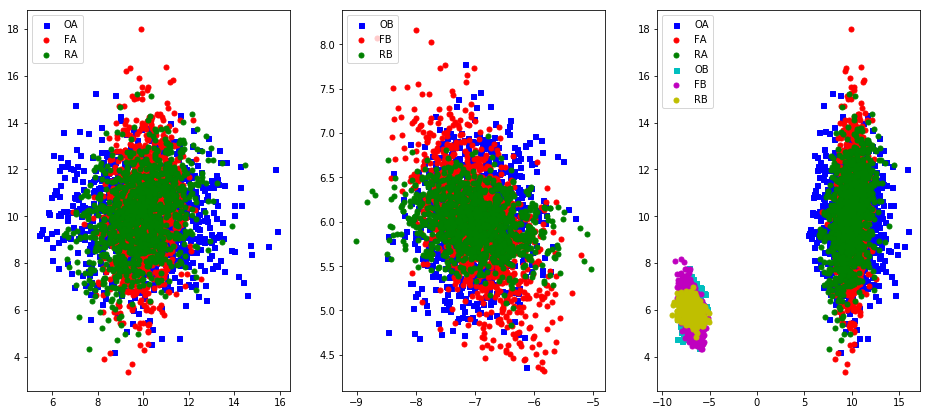

[Epoch 610/1001] [Batch 45/62] [D loss: 0.568320, acc:  75%] [G loss: 5.254581, adv: 1.816910, recon: 0.365042, id: 0.301863] time: 0:05:39.093472 


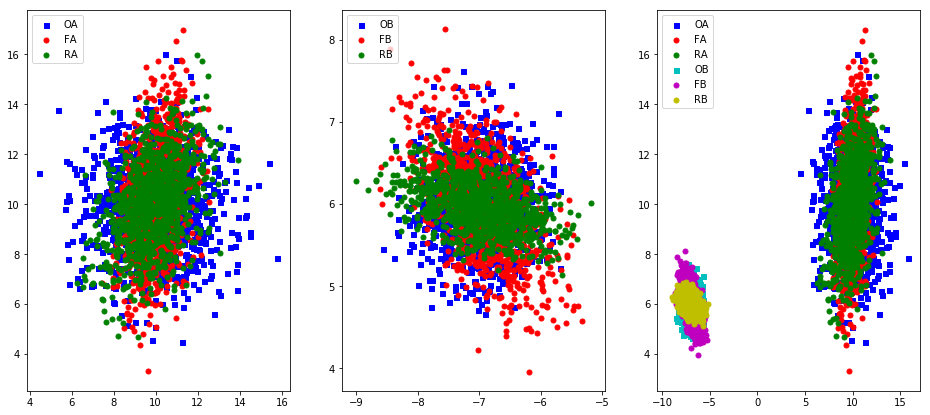

[Epoch 620/1001] [Batch 45/62] [D loss: 0.565900, acc:  73%] [G loss: 5.126283, adv: 1.693151, recon: 0.406463, id: 0.334694] time: 0:05:44.722963 


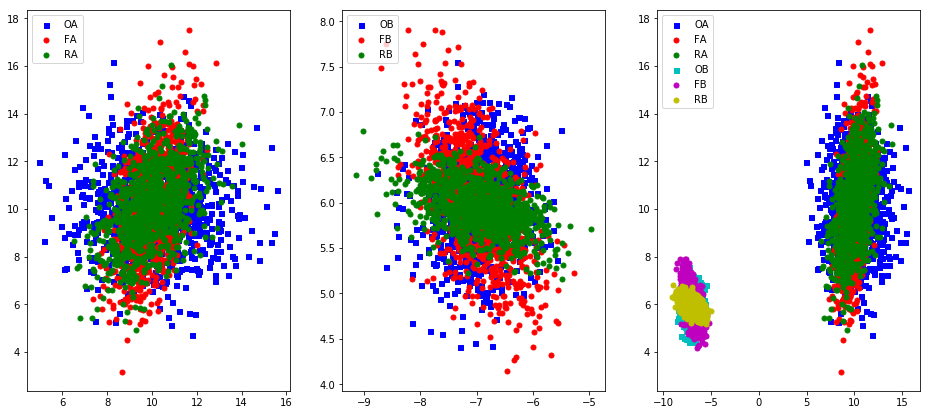

[Epoch 630/1001] [Batch 45/62] [D loss: 0.580663, acc:  73%] [G loss: 4.979745, adv: 1.573802, recon: 0.440306, id: 0.361321] time: 0:05:50.668081 


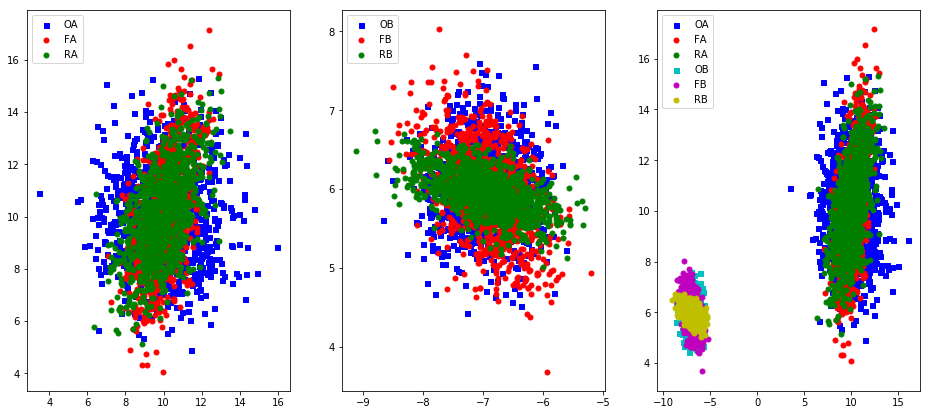

[Epoch 640/1001] [Batch 45/62] [D loss: 0.589432, acc:  73%] [G loss: 4.888505, adv: 1.490252, recon: 0.469280, id: 0.384261] time: 0:05:56.099946 


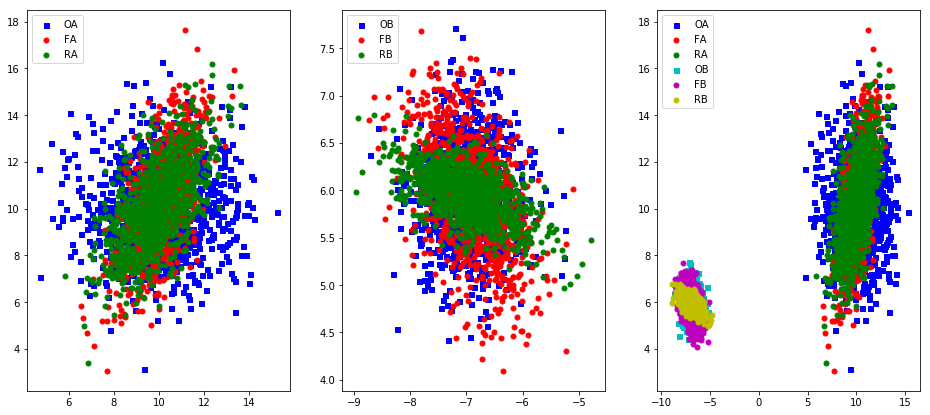

[Epoch 650/1001] [Batch 45/62] [D loss: 0.597657, acc:  71%] [G loss: 4.821593, adv: 1.426974, recon: 0.492596, id: 0.402007] time: 0:06:01.555159 


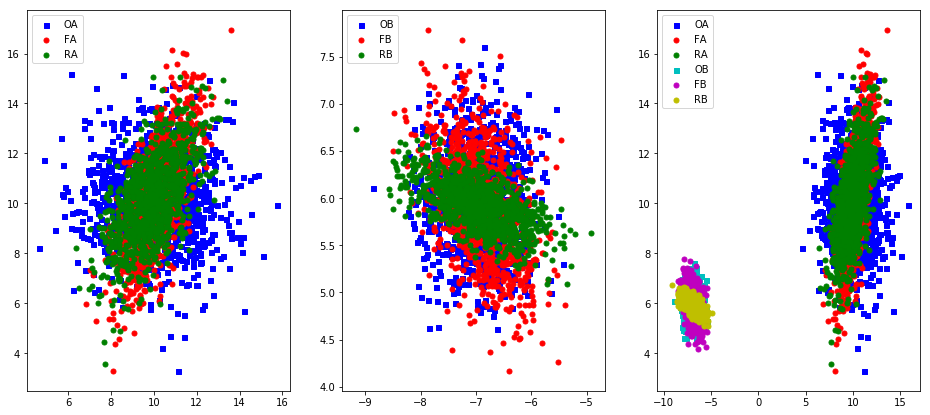

[Epoch 660/1001] [Batch 45/62] [D loss: 0.605862, acc:  71%] [G loss: 4.764123, adv: 1.373153, recon: 0.513716, id: 0.418025] time: 0:06:06.996376 


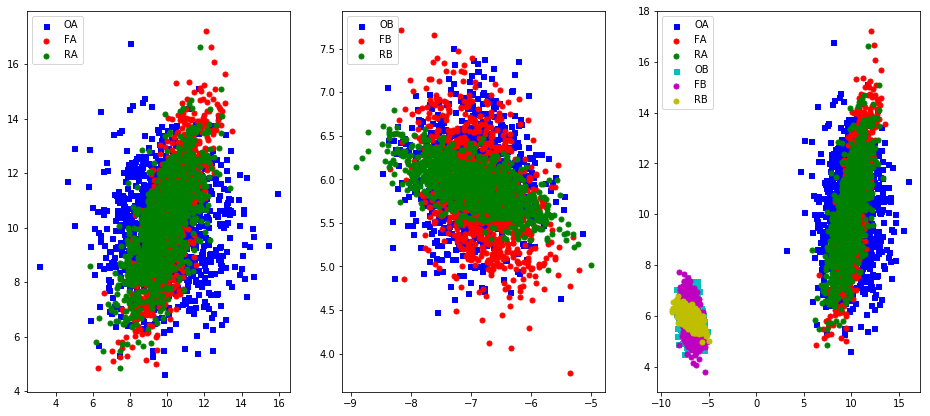

[Epoch 670/1001] [Batch 45/62] [D loss: 0.609286, acc:  71%] [G loss: 4.750165, adv: 1.344971, recon: 0.532059, id: 0.432185] time: 0:06:12.453183 


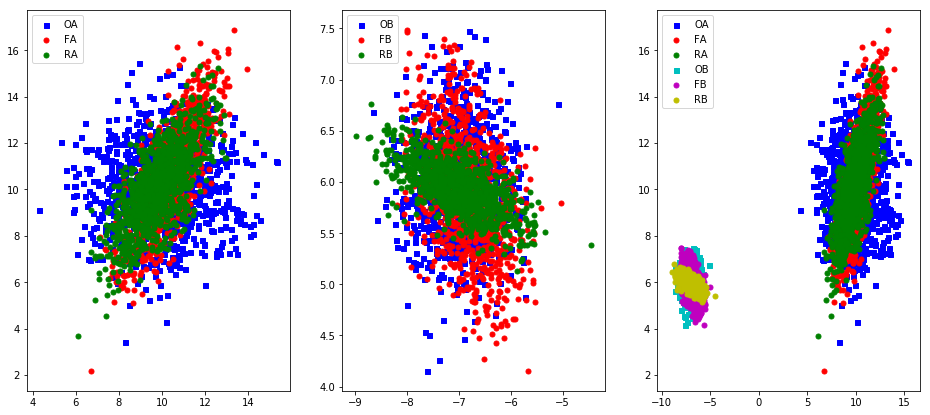

[Epoch 680/1001] [Batch 45/62] [D loss: 0.610643, acc:  71%] [G loss: 4.749250, adv: 1.325320, recon: 0.549341, id: 0.445606] time: 0:06:17.915056 


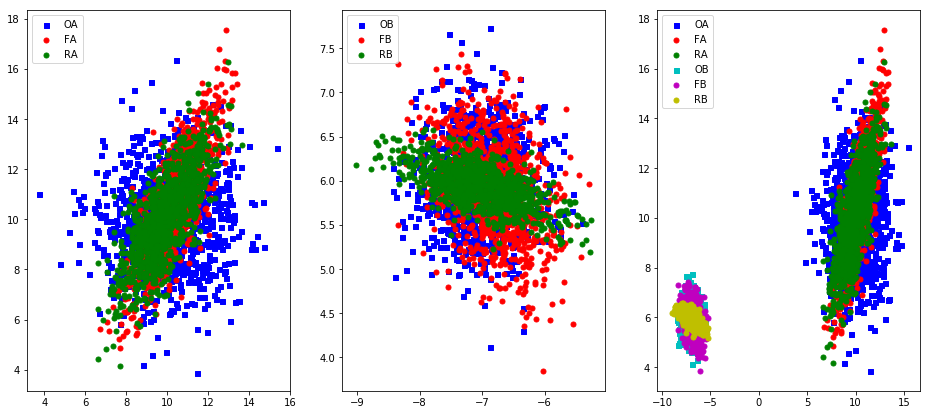

[Epoch 690/1001] [Batch 45/62] [D loss: 0.610466, acc:  70%] [G loss: 4.754871, adv: 1.311195, recon: 0.564742, id: 0.457066] time: 0:06:23.371561 


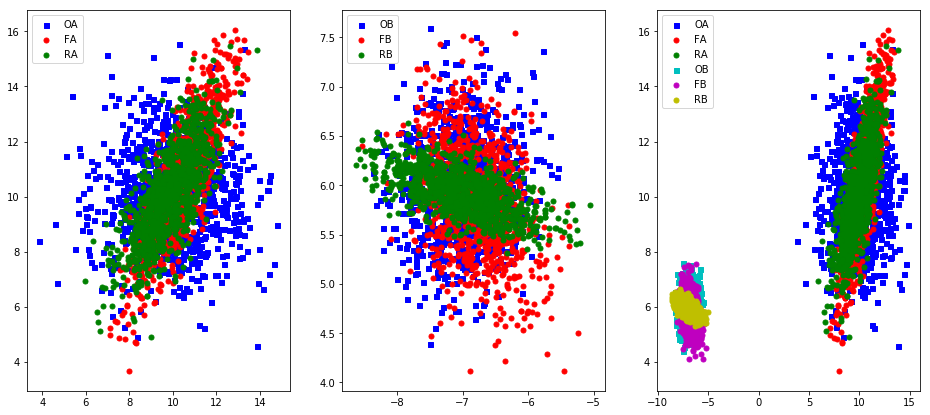

[Epoch 700/1001] [Batch 45/62] [D loss: 0.608555, acc:  68%] [G loss: 4.769059, adv: 1.302434, recon: 0.579515, id: 0.468102] time: 0:06:28.832403 


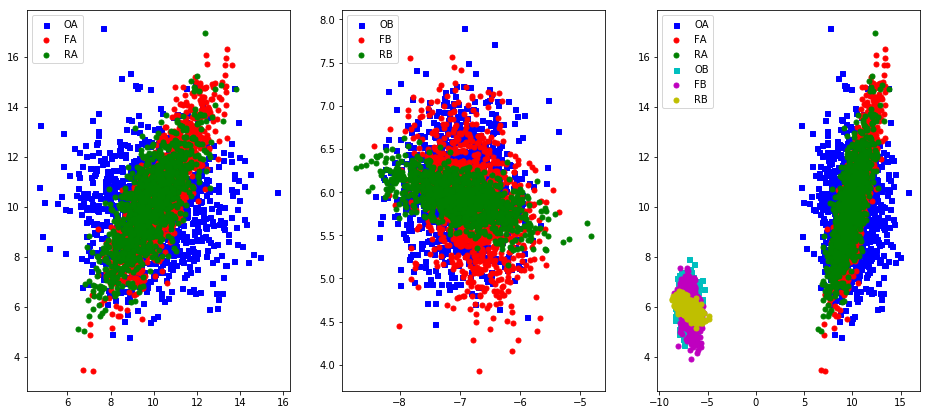

[Epoch 710/1001] [Batch 45/62] [D loss: 0.604803, acc:  71%] [G loss: 4.794329, adv: 1.299368, recon: 0.594825, id: 0.479886] time: 0:06:34.283365 


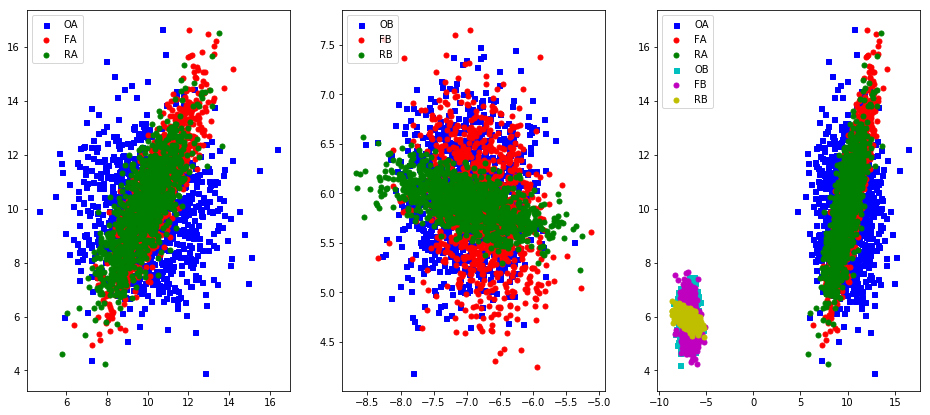

[Epoch 720/1001] [Batch 45/62] [D loss: 0.599525, acc:  71%] [G loss: 4.825489, adv: 1.300991, recon: 0.608876, id: 0.490012] time: 0:06:39.736155 


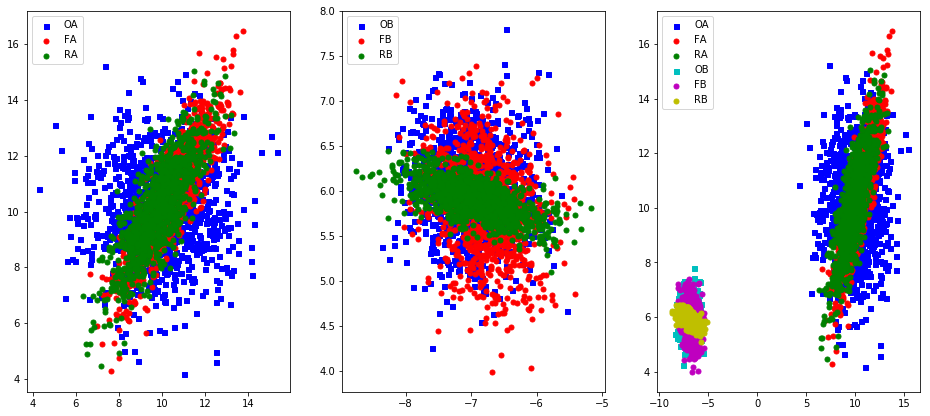

[Epoch 730/1001] [Batch 45/62] [D loss: 0.593087, acc:  71%] [G loss: 4.864851, adv: 1.306781, recon: 0.623941, id: 0.501170] time: 0:06:45.437651 


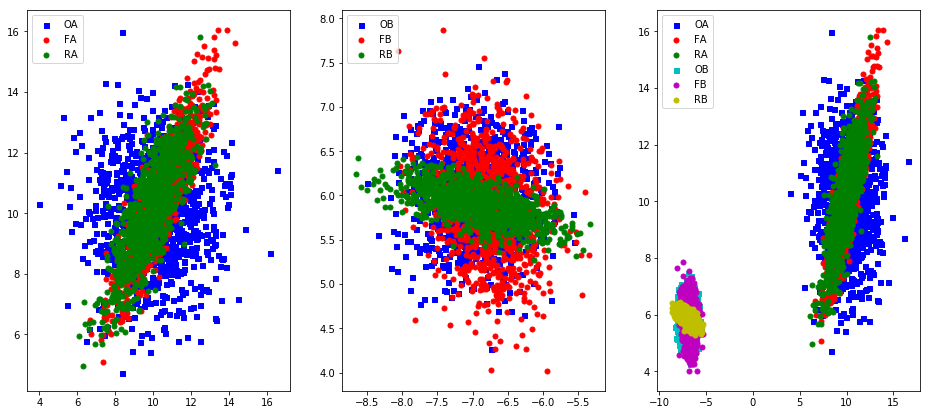

[Epoch 740/1001] [Batch 45/62] [D loss: 0.585028, acc:  73%] [G loss: 4.915823, adv: 1.318114, recon: 0.639838, id: 0.513219] time: 0:06:51.281167 


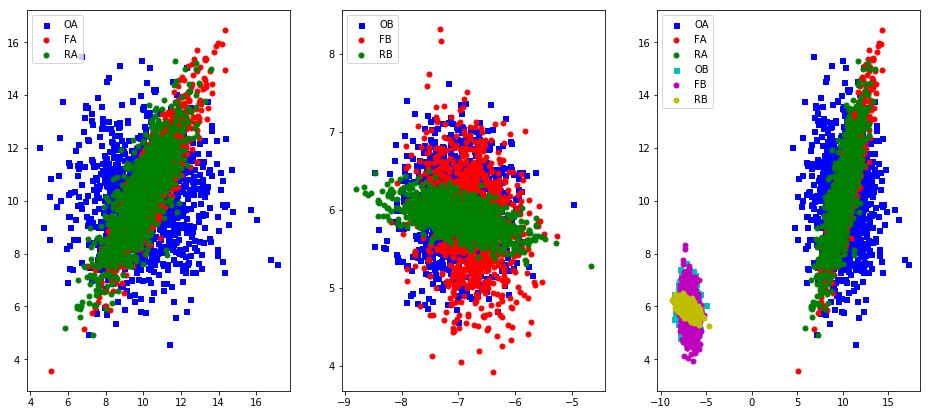

[Epoch 750/1001] [Batch 45/62] [D loss: 0.575906, acc:  71%] [G loss: 4.972887, adv: 1.334080, recon: 0.654893, id: 0.522560] time: 0:06:56.718926 


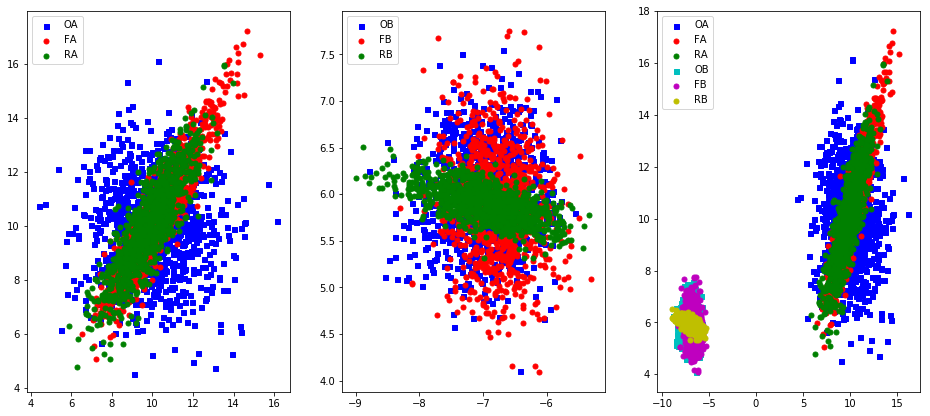

[Epoch 760/1001] [Batch 45/62] [D loss: 0.566326, acc:  71%] [G loss: 5.052728, adv: 1.351436, recon: 0.682521, id: 0.541538] time: 0:07:02.181700 


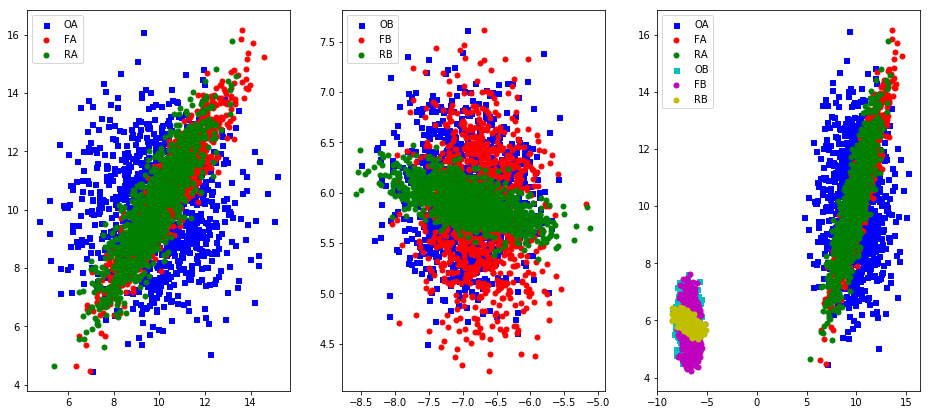

[Epoch 770/1001] [Batch 45/62] [D loss: 0.554444, acc:  71%] [G loss: 5.145710, adv: 1.379730, recon: 0.705253, id: 0.561929] time: 0:07:07.655338 


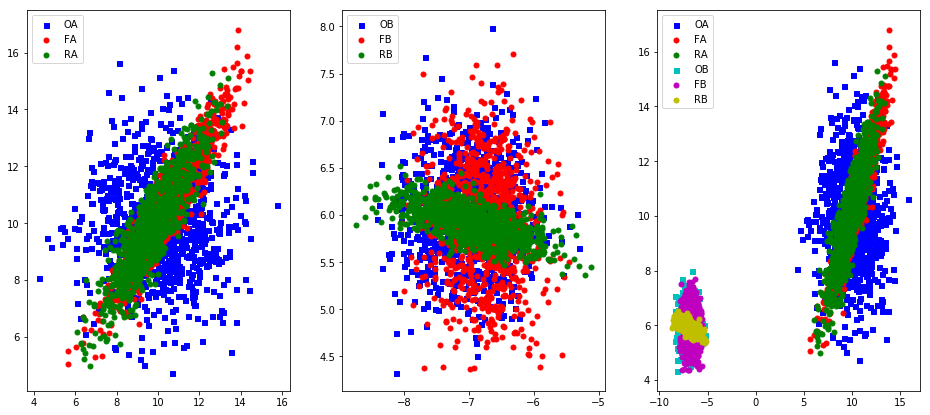

[Epoch 780/1001] [Batch 45/62] [D loss: 0.541075, acc:  68%] [G loss: 5.234160, adv: 1.411992, recon: 0.724389, id: 0.573435] time: 0:07:13.119173 


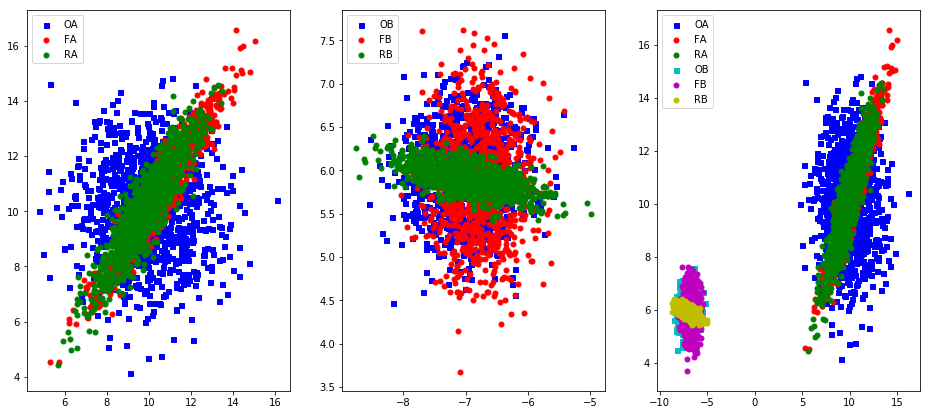

[Epoch 790/1001] [Batch 45/62] [D loss: 0.526844, acc:  68%] [G loss: 5.328264, adv: 1.448324, recon: 0.742681, id: 0.589476] time: 0:07:18.573744 


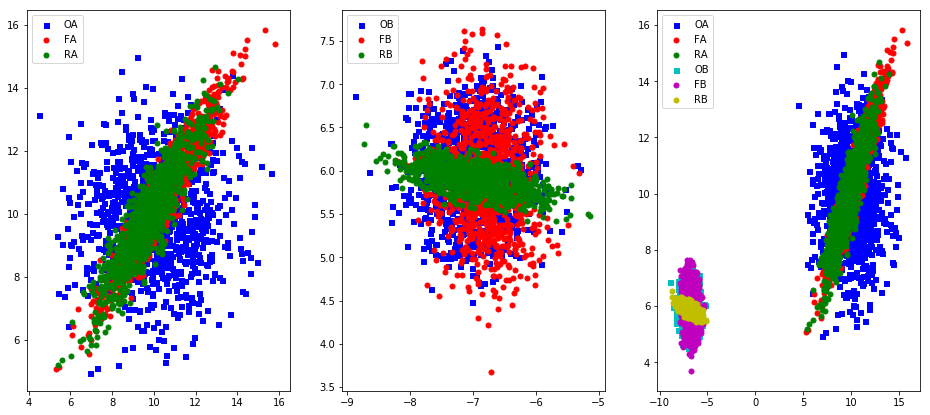

[Epoch 800/1001] [Batch 45/62] [D loss: 0.511942, acc:  70%] [G loss: 5.444289, adv: 1.491352, recon: 0.765286, id: 0.614131] time: 0:07:24.037963 


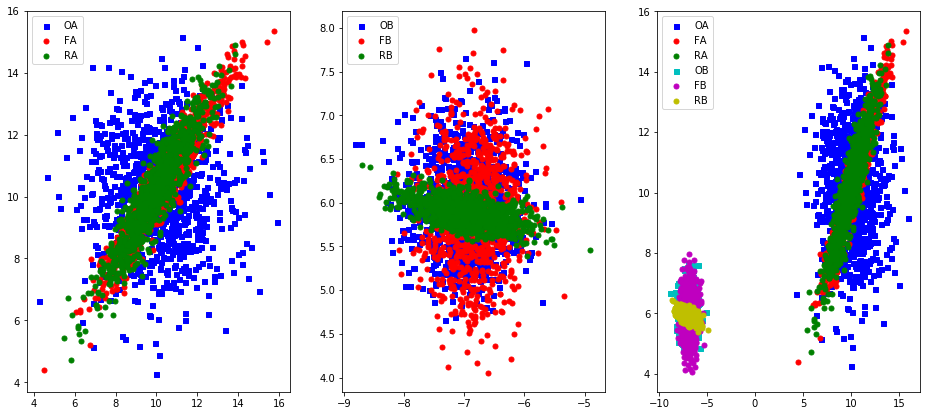

[Epoch 810/1001] [Batch 45/62] [D loss: 0.499673, acc:  70%] [G loss: 5.594218, adv: 1.530360, recon: 0.812936, id: 0.662014] time: 0:07:29.507627 


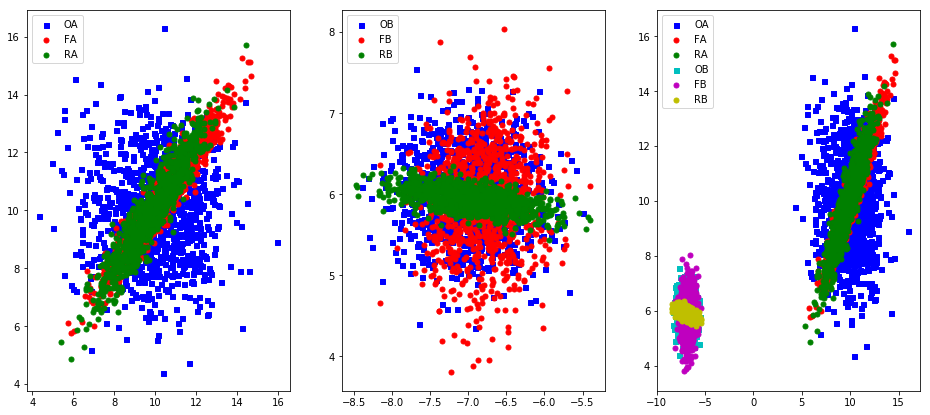

[Epoch 820/1001] [Batch 45/62] [D loss: 0.483646, acc:  71%] [G loss: 5.700949, adv: 1.588198, recon: 0.823406, id: 0.667111] time: 0:07:34.974890 


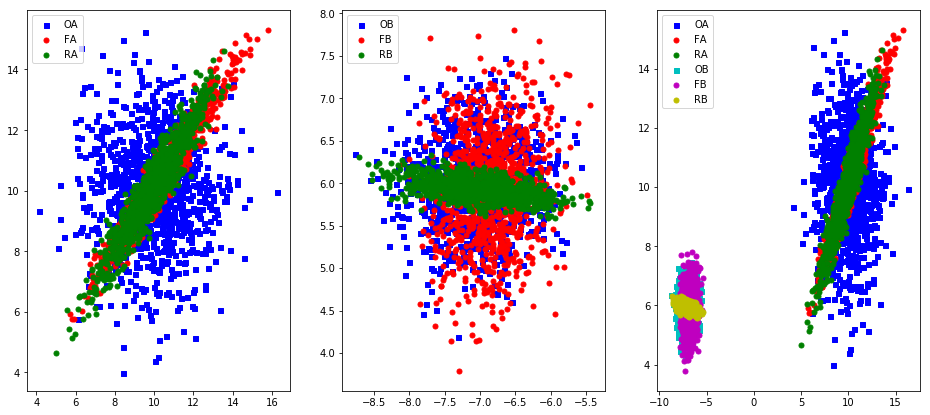

[Epoch 830/1001] [Batch 45/62] [D loss: 0.468697, acc:  70%] [G loss: 5.850343, adv: 1.648266, recon: 0.851718, id: 0.699888] time: 0:07:40.433933 


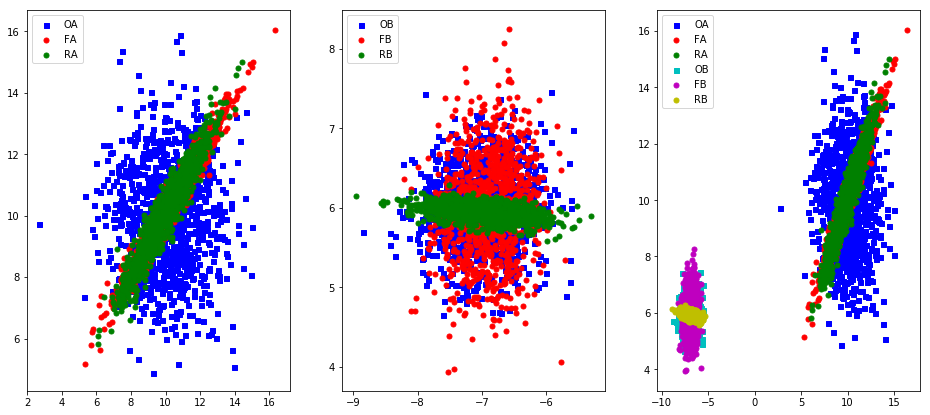

[Epoch 840/1001] [Batch 45/62] [D loss: 0.455262, acc:  73%] [G loss: 5.997154, adv: 1.709118, recon: 0.878073, id: 0.727700] time: 0:07:46.235441 


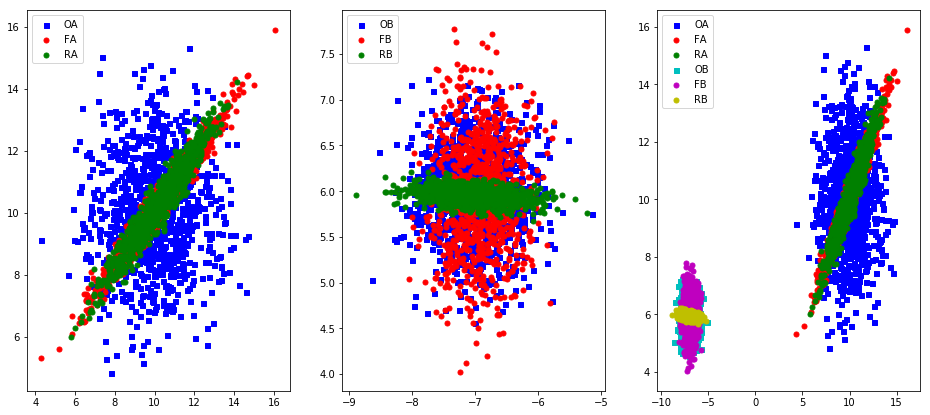

[Epoch 850/1001] [Batch 45/62] [D loss: 0.444422, acc:  70%] [G loss: 6.125474, adv: 1.765536, recon: 0.892337, id: 0.747579] time: 0:07:51.980628 


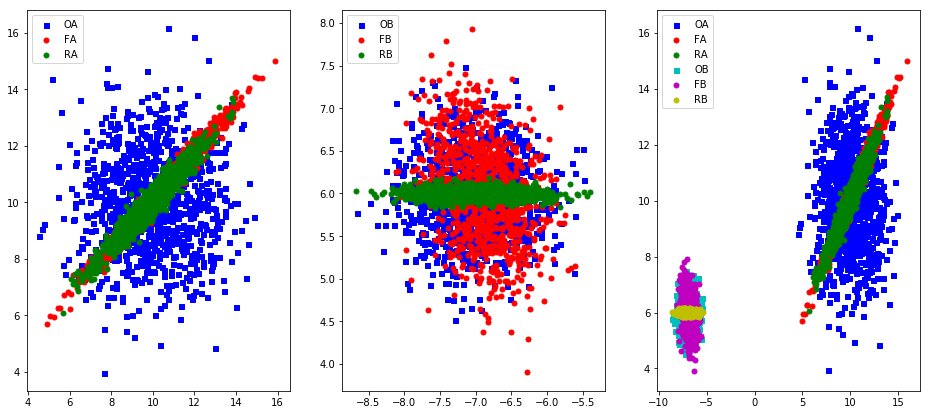

[Epoch 860/1001] [Batch 45/62] [D loss: 0.436131, acc:  68%] [G loss: 6.194102, adv: 1.808405, recon: 0.878733, id: 0.738699] time: 0:07:57.470105 


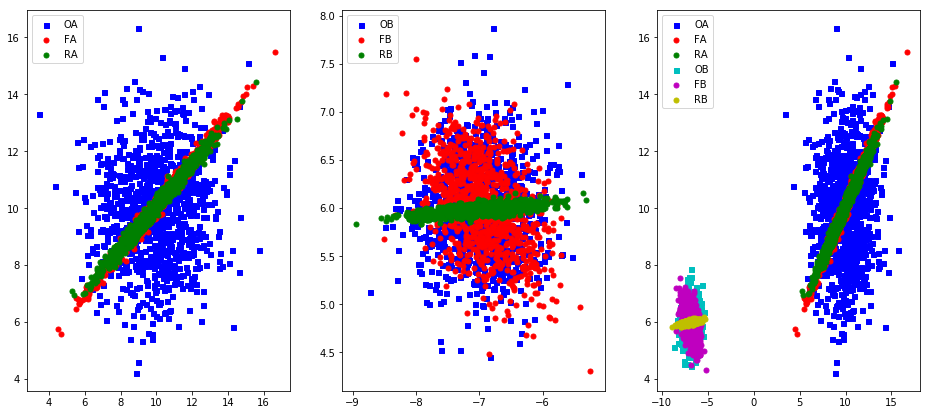

[Epoch 870/1001] [Batch 45/62] [D loss: 0.438001, acc:  60%] [G loss: 6.199661, adv: 1.813007, recon: 0.868153, id: 0.727632] time: 0:08:02.936699 


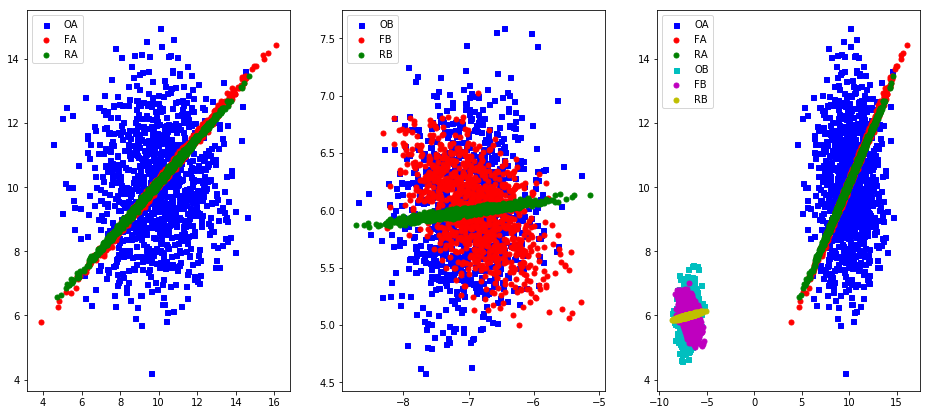

[Epoch 880/1001] [Batch 45/62] [D loss: 0.446340, acc:  50%] [G loss: 6.162919, adv: 1.790449, recon: 0.862198, id: 0.719622] time: 0:08:08.395315 


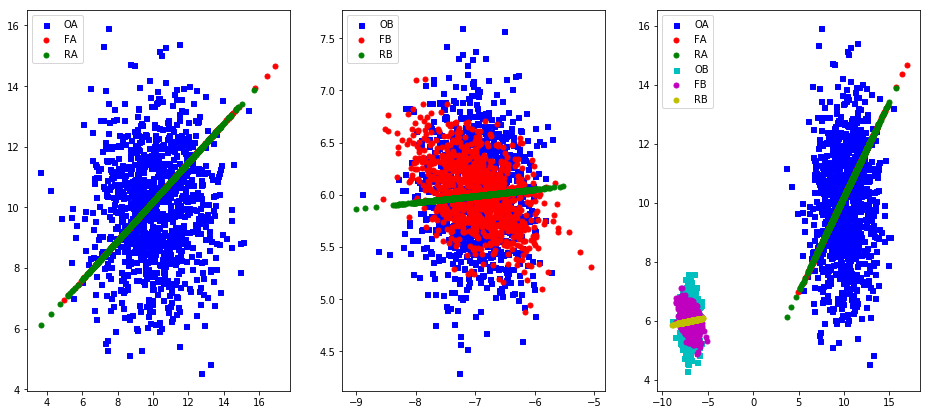

[Epoch 890/1001] [Batch 45/62] [D loss: 0.452808, acc:  48%] [G loss: 6.097804, adv: 1.761544, recon: 0.850603, id: 0.711801] time: 0:08:13.857461 


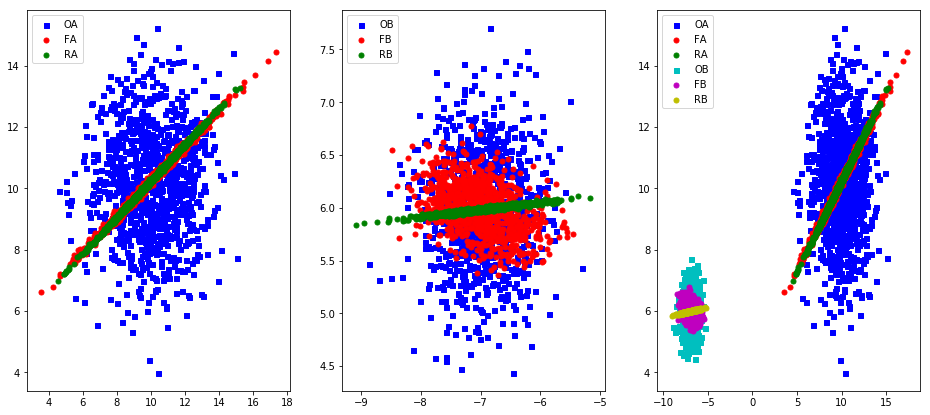

[Epoch 900/1001] [Batch 45/62] [D loss: 0.459480, acc:  48%] [G loss: 5.975519, adv: 1.718868, recon: 0.829524, id: 0.695397] time: 0:08:19.274778 


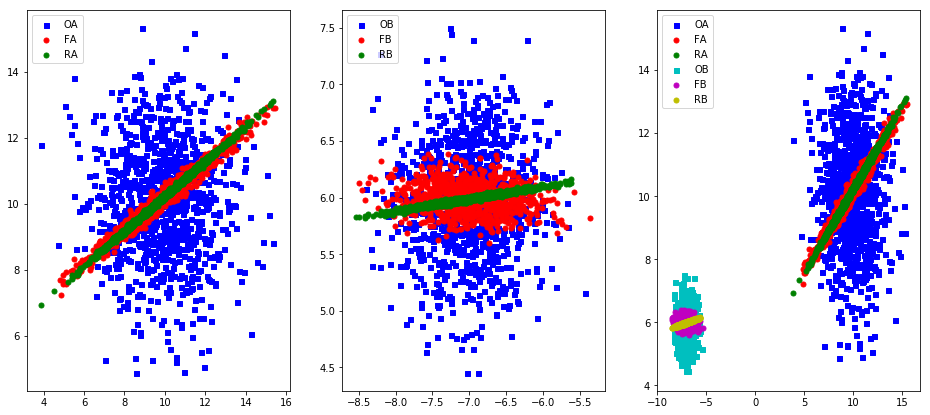

[Epoch 910/1001] [Batch 45/62] [D loss: 0.469221, acc:  46%] [G loss: 5.800532, adv: 1.668641, recon: 0.789356, id: 0.672911] time: 0:08:24.711801 


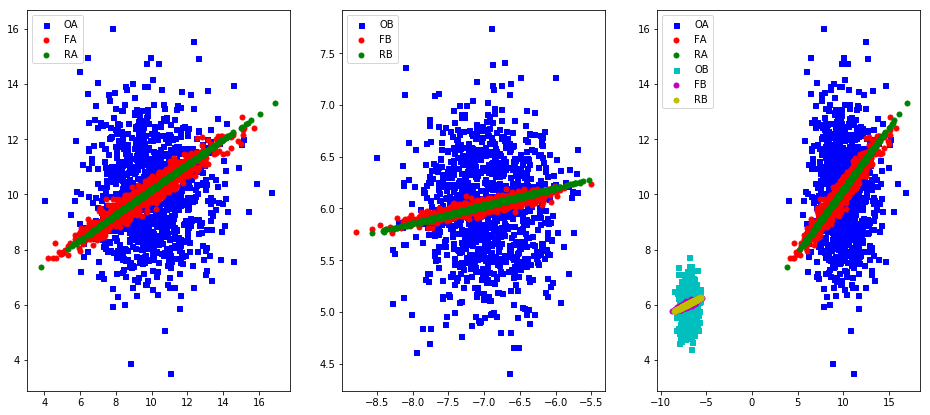

[Epoch 920/1001] [Batch 45/62] [D loss: 0.483872, acc:  45%] [G loss: 5.539990, adv: 1.589967, recon: 0.748792, id: 0.634985] time: 0:08:30.148668 


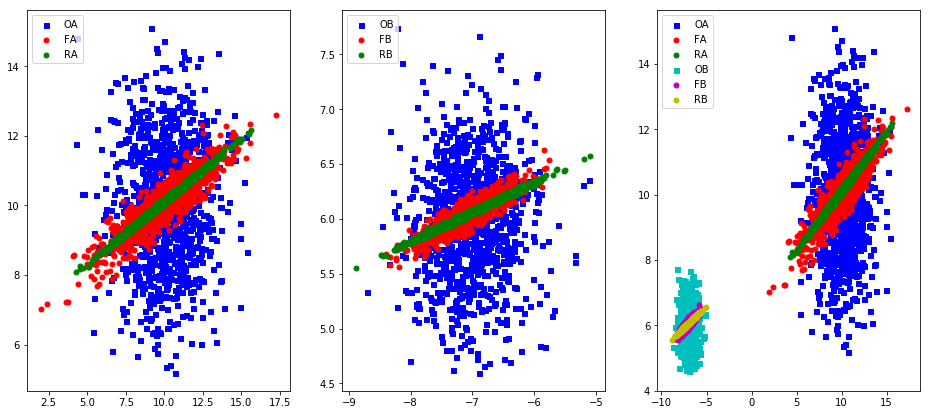

[Epoch 930/1001] [Batch 45/62] [D loss: 0.506621, acc:  42%] [G loss: 5.168365, adv: 1.479944, recon: 0.690975, id: 0.577127] time: 0:08:35.585692 


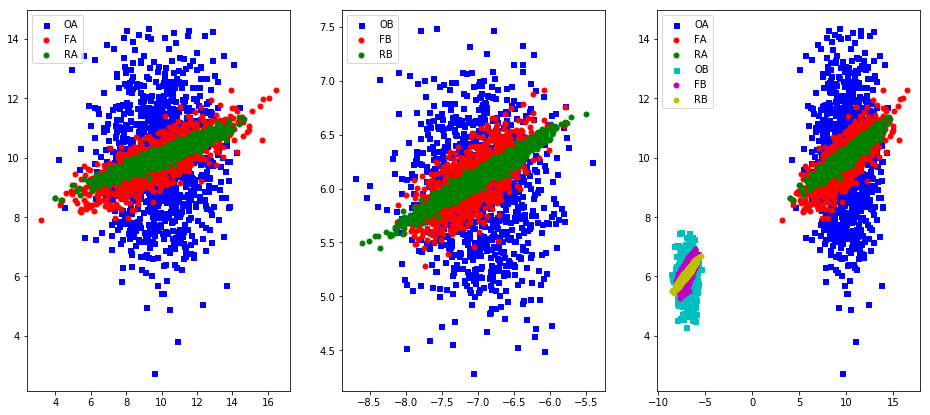

[Epoch 940/1001] [Batch 45/62] [D loss: 0.550132, acc:  40%] [G loss: 4.703063, adv: 1.330881, recon: 0.628588, id: 0.502643] time: 0:08:41.027339 


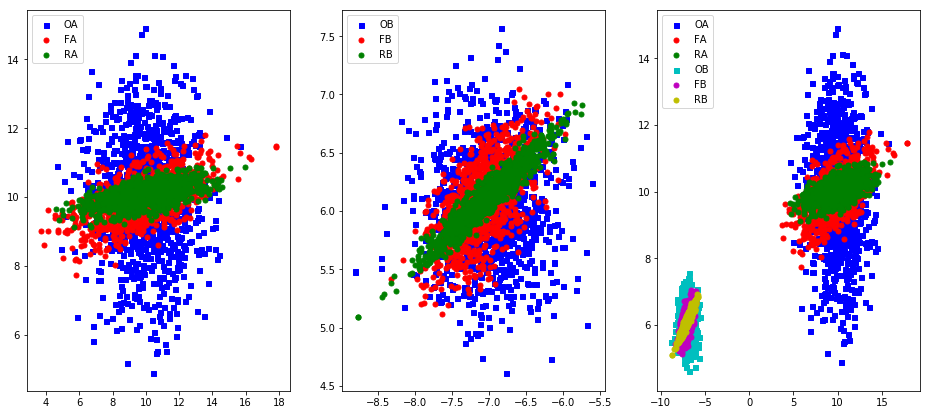

[Epoch 950/1001] [Batch 45/62] [D loss: 0.592154, acc:  37%] [G loss: 4.362981, adv: 1.223314, recon: 0.568676, id: 0.467085] time: 0:08:46.908937 


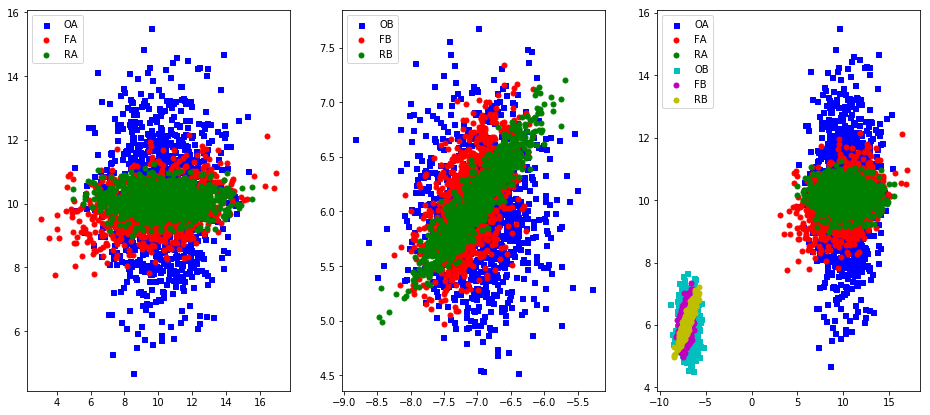

[Epoch 960/1001] [Batch 45/62] [D loss: 0.657883, acc:  35%] [G loss: 4.001178, adv: 1.088344, recon: 0.519009, id: 0.451379] time: 0:08:52.553076 


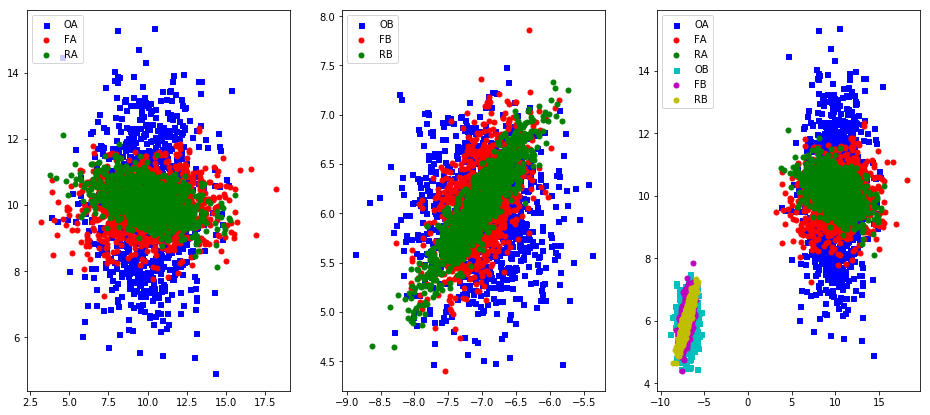

[Epoch 970/1001] [Batch 45/62] [D loss: 0.681001, acc:  34%] [G loss: 3.685265, adv: 0.949323, recon: 0.495733, id: 0.450539] time: 0:08:57.997188 


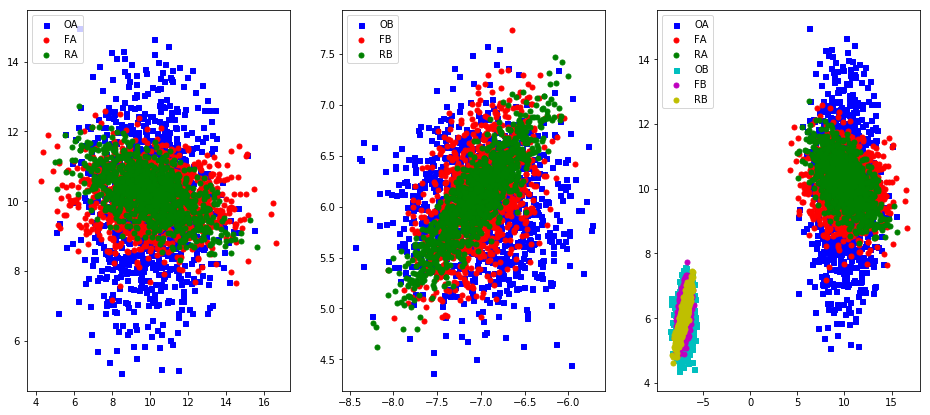

[Epoch 980/1001] [Batch 45/62] [D loss: 0.661974, acc:  34%] [G loss: 3.627981, adv: 0.911829, recon: 0.493361, id: 0.454976] time: 0:09:03.452582 


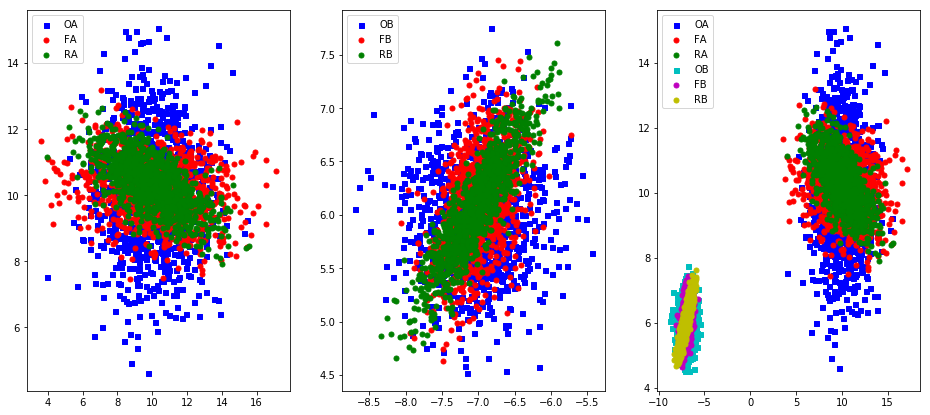

[Epoch 990/1001] [Batch 45/62] [D loss: 0.650913, acc:  34%] [G loss: 3.673038, adv: 0.929976, recon: 0.488395, id: 0.452556] time: 0:09:08.912378 


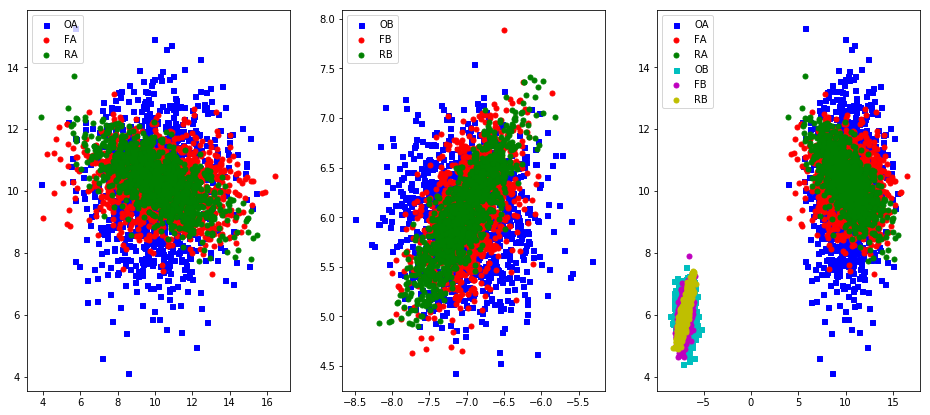

[Epoch 1000/1001] [Batch 45/62] [D loss: 0.639982, acc:  34%] [G loss: 3.711493, adv: 0.945835, recon: 0.486249, id: 0.453964] time: 0:09:14.370212 


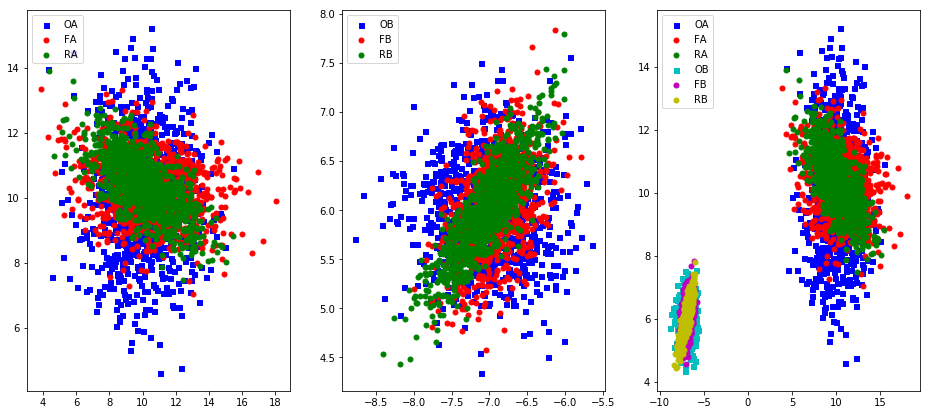

In [72]:
gan.train(epochs=1001, batch_size=16, sample_interval=10)